<div style="text-align: center;">
    <h1 style="font-size: 20px;">
        Final project for the <strong style="font-size: 26px;">Information theory</strong> course<br>
        <strong style="font-size: 46px; display: block; margin-top: 20px;">Inferring change points in the spread of COVID-19</strong>
    </h1>
</div>

<hr style="border: 1px solid #000;">

<div style="display: flex; justify-content: center; align-items: center; width: 100%; text-align: center; position: relative;">
    <img src="figures/unipd_template.png" alt="Unipd template" style="max-width: 300px; height: auto; margin-left:250px">
    <img src="figures/pod_template_transparent.png" alt="PoD template" style="max-width: 300px; height: auto; margin-left: 50px;">
</div>



<hr style="border: 1px solid #000;">

<div style="text-align: left; margin: 0 auto; width: 80%;">
    <p><strong style="font-size: 26px;">University of Padua - Department of Physics and Astronomy</strong></p>
    <p><strong>Degree course:</strong> Physics of Data</p>
    <p><strong>Course:</strong> Information Theory </p>
    <p><strong>Year:</strong> 2024-2025</p>
    <p><strong>Professor in charge:</strong> Michele Allegra </p>
    <table style="margin: 20px auto; border-collapse: collapse; width: 100%; font-size: 15px; text-align: left;">
        <thead>
            <tr>
                <th colspan="3" style="border: none; padding: 8px; text-align: center; font-weight: bold; font-size: 20px">Students</th>
            </tr>
            <tr>
                <th style="border: none; padding: 8px;">Name</th>
                <th style="border: none; padding: 8px;">ID</th>
                <th style="border: none; padding: 8px;">Email</th>
            </tr>
        </thead>
        <tbody>
            <tr>
                <td style="border: none; padding: 8px;">Ada D'Iorio</td>
                <td style="border: none; padding: 8px;">2092320</td>
                <td style="border: none; padding: 8px;">ada.diorio@studenti.unipd.it</td>
            </tr>
            <tr>
                <td style="border: none; padding: 8px;">Anna Garbo</td>
                <td style="border: none; padding: 8px;">2091751</td>
                <td style="border: none; padding: 8px;">anna.garbo.2@studenti.unipd.it</td>
            </tr>
        </tbody>
    </table>
</div>


### Abstract
In this project two different sampling techninques will be tested. In particular they will be tested in context of SIR model for COVID-19 pandemic at early stage, indeed the reference comes from the article [*Inferring change points in the spread of COVID-19 reveals the effectiveness of interventions*](https://www.science.org/doi/10.1126/science.abb9789) by Jonas Dehning et al. 

The parameter of the SIR model will be estimated through inference techniques. For the Likelihood computation we used synthetic data assuming that the prevalvence (number of infected indivduals during time) followed the SIR model. The article propose a sofisticated model in which the classic SIR model is modified adding changing points for the transmission rate and the estimation of the delay for reporting cases, which is a charachteristic we all observe during COVID-19 pandemic. Considering this we tested the two tecninques in different steps, first for classical SIR model, then for SIR model with the introduction of the delay for reported cases, then with one changing points and no delay and so on until we get the complete model showed in the article.

The two algorithm that have been tested are Metropolis Hastings for **Markov Chain MonteCarlo** and **NUTS** (Not U Turning Sampler) developed in **PYMC** package for python language. What we can observe is that NUTS better explore the parameter space than the Metropolis Hastings algorithm since it can better deal with the denominated 'curse of dimensionality'.  

Here the theoric framework we are dealing with.

## Bayesian Inference

Bayesian inference is a statistical approach in which we update the knowledge that we have about model parameters, described with $\theta$, based on the observed data. 
The final result is the so called **posterior distribution**, given by a combination of our initial assumption (**the prior distribution**) with the evidence (**likelihood**).

### Posterior Distribution (Bayes' rule):

$
p(\theta \mid D) = \frac{p(D \mid \theta) p(\theta)}{p(D)} \propto p(D \mid \theta) p(\theta)
$

Where:
- $(p(D \mid \theta))$ is the **likelihood**.
- $(p(\theta))$ is the **prior distribution**.
- $(p(D))$ is the normalization constant (not needed explicitly in Metropolis-Hastings).

### Steps of the Metropolis-Hastings Algorithm:

Given a current state $(\theta^{(t)})$, the algorithm performs the following steps:

1. Propose a new state $(\theta^*)$ from the proposal distribution $(q(\theta^* \mid \theta^{(t)}))$.

2. Compute the acceptance ratio:
$[
\alpha = \frac{p(D \mid \theta^*) p(\theta^*) q(\theta^{(t)} \mid \theta^*)}{p(D \mid \theta^{(t)}) p(\theta^{(t)}) q(\theta^* \mid \theta^{(t)})}
]$

3. Accept the new state $(\theta^*)$ with probability:
$[
A(\theta^{(t)} \rightarrow \theta^*) = \min\left(1, \alpha\right)
]$

4. If accepted, set $(\theta^{(t+1)} = \theta^*)$, otherwise set $(\theta^{(t+1)} = \theta^{(t)})$.

By repeating these steps, we generate a chain of samples:
$[
\theta^{(0)} \rightarrow \theta^{(1)} \rightarrow \dots \rightarrow \theta^{(N)}
]$

These samples approximate the posterior distribution $(p(\theta \mid D)$), also called limiting distribution of the chain.


### How NUTS Works:

Hamiltonian Monte Carlo is an efficient sampling technique used to implement MCMC algorithms. It employs Hamiltonian dynamics in order to construct the chain. It needs two hyperparameters in order to work efficiently:
- trajectory length (number of integrating steps);
- step size 

NUTS automates the selection of trajectory length in Hamiltonian Monte Carlo by preventing the trajectory from "turning back" on itself (U-turn), thereby improving sampling efficiency.

Given a current state $(\theta^{(t)})$, NUTS performs the following steps:

1. Sample momentum $(r)$ from a normal distribution:
$[
r \sim \mathcal{N}(0, M)
]$
where $(M)$ is typically the identity matrix or an adaptive mass matrix.

2. Evolve the system using Hamiltonian dynamics with leapfrog integration:
$[
\frac{d\theta}{dt} = M^{-1}r, \quad \frac{dr}{dt} = -\nabla U(\theta)
]$
where $(U(\theta) = -\log p(D \mid \theta) - \log p(\theta))$.

3. At each iteration the algorithm is evolving forward and backward in time building a binary tree of points. After each one, it veryfies the **U-turn** criterion:


$[
(\theta^{+} - \theta^{-}) \cdot r^{-} < 0 \quad \text{or} \quad (\theta^{+} - \theta^{-}) \cdot r^{+} < 0
]$

It is checking if the last movement direction is going accordingly to the general one; if it is not respected, the execution is stopped.

4. Choose a new candidate state $(\theta^*)$ uniformly from the set of points explored.

5. Accept $(\theta^*)$ based on the Hamiltonian Metropolis acceptance criterion (energy conservation).

Repeating this process generates a sequence of samples:
$[
\theta^{(0)} \rightarrow \theta^{(1)} \rightarrow \dots \rightarrow \theta^{(N)}
]$
that are approximating the posterior distribution $(p(\theta \mid D))$.


##  Description of the Functions Used in the SIR Model

This notebook contains a complete implementation of a **discrete-time Susceptible-Infected-Recovered (SIR)** model, extended to include realistic dynamics such as reporting delays, gradual transitions in transmission rate, weekend effects, and Bayesian inference.

---

###  Auxiliary Functions

- **`smooth_step_function(start_val, end_val, t_begin, t_end, t_total)`**  
  Produces a gradual linear transition from `start_val` to `end_val` between time steps `t_begin` and `t_end`. Useful to simulate progressive policy changes or behavior shifts over time.

- **`pt_lognormal(x, mu, sigma)`**  
  Constructs a normalized log-normal distribution over `x`, centered at `mu` with scale `sigma`. Used to apply probabilistic delays in the reporting of infections.

- **`make_delay_matrix(n_rows, n_columns)`**  
  Creates a matrix where each element `[i, j]` encodes the delay from time `i` to `j`. Negative delays are clipped to ensure causality.

- **`apply_delay(array, delay, sigma_delay, delay_mat)`**  
  Applies the delay effect on a given array of new infections using a log-normal distribution over the provided delay matrix.

- **`delay_cases_lognormal(input_arr, len_input_arr, len_output_arr, median_delay, scale_delay)`**  
  Combines the previous delay functions into a one-step wrapper to compute observed cases with probabilistic delays.

---

###  Discrete-Time SIR Model Variants

Let $( S(t) )$, $( I(t) )$, and $( R(t) )$ represent the number of susceptible, infected, and recovered individuals at time $( t )$, with:


\begin{aligned}
I_{\text{new}}(t) &= \beta(t) \cdot \frac{S(t-1) \cdot I(t-1)}{N} \\
R_{\text{new}}(t) &= \gamma \cdot I(t-1)
\end{aligned}



- **`sir_discrete_delay_w_switch(beta_before, beta_after, gamma, delay, I0, scale, t_switch, dt_switch, t_max, N)`**  
  Introduces a smooth transition in \( $\beta(t)$ \) from `beta_before` to `beta_after` using a sigmoid function:


\begin{aligned}
  \beta(t) = \beta_{\text{before}} \cdot (1 - T(t)) + \beta_{\text{after}} \cdot T(t), \\ \quad T(t) = \frac{1}{1 + \exp\left( -\frac{t - t_{\text{switch}}}{\Delta t} \right)}
 \end{aligned} 

---

###  Bayesian Inference with MCMC

- **`metropolis_hastings(log_posterior, initial_params, data, n_iter, step_sizes)`**  
  Implements the classic Metropolis-Hastings algorithm to draw samples from the posterior distribution of model parameters.

- **`metropolis_hastings_multi_chain(...)`**  
  Executes multiple independent MCMC chains using different initial guesses and step sizes to improve parameter exploration and convergence diagnostics.



This suite of functions provides a flexible framework for epidemic modeling, allowing for both simulation and inference under realistic assumptions such as delays, gradual interventions, and reporting biases.


# Basic SIR model (no switch and no delay) 

In this first section we are going to implement the basic SIR model structure, characterised by solving the system of differential equations:

$$
\begin{cases}
\frac{dS}{dt} = - \beta S I \\  
\frac{dI}{dt} = \beta S I - \gamma I \\  
\frac{dR}{dt} = \gamma I  
\end{cases}
$$

by integrating this system of equations it is possible to study the evolution of a pandemic.

In this basic model, the parameters that are going to be inferred are the *spreading rate* $\beta$, the recovery rate $\gamma$, the initial number of infected $I_0$ and the scale factor $\sigma$.

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
import scipy.stats as stats
import pymc as pm
import pytensor 
import pytensor.tensor as pt
import pandas as pd 
import arviz as az 
import multiprocessing
from datetime import datetime, timedelta 
from SIR_functions import metropolis_hastings, metropolis_hastings_multi_chain

In [3]:
from SIR_functions import sir_discrete

# Parameters
N = 1e6 # population size 
t_max = 100
# Initial parameters for priors 
sigma_beta, mu_beta = 0.5, np.log(0.4) # initial value 0.5 for sigma
sigma_gamma, mu_gamma = 0.2, np.log(1/8) # \ \ 0.2 
sigma_I0 = 100
sigma_scale = 100 # 10 before 


## MCMC sampling

In order to solve the problem, we are going to use the **Markov Chain Monte Carlo** method. The aim is to build a chain that has as limiting distribution the posterior of all the parameters that have to be inferred in the model.
In the first part, we are going to construct from scratches the algorithm, defining the prior and likelihood distributions. For the seek of semplicity, we are going to define the **logprior** and **logposterior**. In this way, the final distribution will be obtained from the sum of all the parameters distributions indipendently.

In particular we have chosen to use the following distributions:

| Parameter         | Variable | Prior distribution                 |
|------------------|---------|-----------------------------------|
| Spreading rate  | \( $\lambda$ \) | LogNormal[log(0.4), 0.5]       |
| Recovery rate   | \( $\mu$ \)     | LogNormal[log(1/8), 0.2]       |
| Initially infected | \( $I_0$ \) | HalfCauchy(100)                |
| Scale factor    | \( $\sigma$ \)  | HalfCauchy(10)                 |

In order to stabilize the result, we are going to sample 20 MCMC chains and take as estimate for the result the mean of the inferred values from each chain. The standard deviation will be estimated too.

In [5]:
# Modello con le prior del paper 
def log_prior(beta, gamma, I0, scale):
    logp = (    
        stats.lognorm.logpdf(beta, s=sigma_beta, scale=np.exp(mu_beta)) +
        stats.lognorm.logpdf(gamma, s=sigma_gamma, scale=np.exp(mu_gamma)) +
        stats.halfcauchy.logpdf(I0, scale=sigma_I0) +
        stats.halfcauchy.logpdf(scale, scale=sigma_scale)
    )
    return logp

In [6]:
def log_likelihood(params, data):
    beta, gamma, I0, scale = params
    I_pred = sir_discrete(beta, gamma, I0,scale, t_max, N)  # Solve SIR model with delay
    
    # Likelihood: Assume reported cases C_t follows Normal(C_pred, scale)
    return np.sum(stats.norm.logpdf(data, loc=I_pred, scale=scale))


In [7]:
# ---- LOG-POSTERIOR ----
def log_posterior(params, data):
    beta, gamma, I0, scale = params
    prior = log_prior(beta, gamma, I0, scale)
    if np.isinf(prior) or np.isnan(prior):
        return -np.inf  # Reject invalid samples
    return prior + log_likelihood(params, data)

In [8]:
# ---- SIMULATE DATA ----
true_params = [0.4, 1/8, 100, 2]  # True values for beta, gamma, I0, scale
n_chains = 15
S0 = N - true_params[2]
y0 = [S0, true_params[2], 0]
t = np.linspace(0, 100, 100)
I_true = sir_discrete(*true_params, t_max, N) + np.random.normal(0, true_params[3], size=len(t))  # Add noise

# ---- RUN MCMC ----
initial_guess = [0.7, 0.05, 80, 1] 

initial_params_list = [
    initial_guess + np.random.normal(0, [0.02, 0.02, 10, 0.2], 4)
    for _ in range(n_chains)
]

step_sizes_list = [
    np.array([0.01, 0.02, 10, 0.05]) + np.random.uniform(-0.005, 0.005, 4)
    for _ in range(n_chains)
]

samples = metropolis_hastings_multi_chain(log_posterior, initial_params_list, step_sizes_list, I_true, n_iter=20000, n_chains=n_chains)

Running chain 1/15...


/Users/annagarbo/Desktop/Info_theory_covid/SIR_functions.py:329: RuntimeWarning: overflow encountered in exp
  accept_ratio = np.exp(logp_new - logp_old)


Running chain 2/15...
Running chain 3/15...
Running chain 4/15...
Running chain 5/15...
Running chain 6/15...
Running chain 7/15...
Running chain 8/15...
Running chain 9/15...
Running chain 10/15...
Running chain 11/15...
Running chain 12/15...
Running chain 13/15...
Running chain 14/15...
Running chain 15/15...


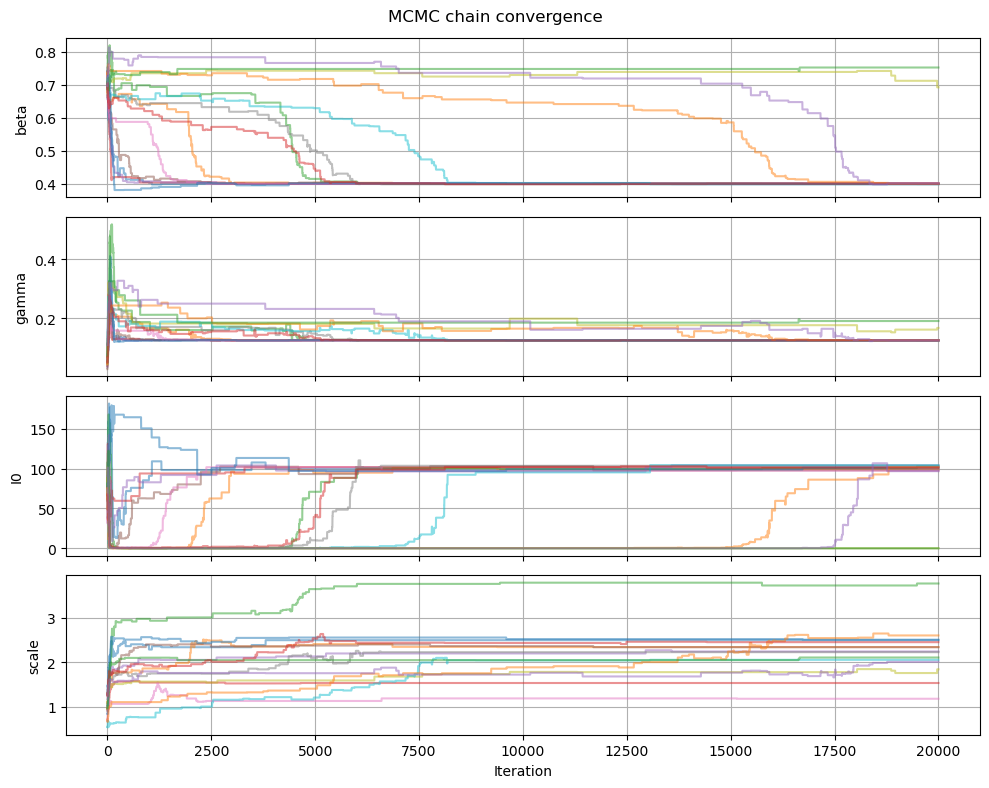

In [14]:
param_names = ["beta", "gamma", "I0", "scale"]

fig, axes = plt.subplots(len(param_names), 1, figsize=(10, 2 * len(param_names)), sharex=True)

for i, ax in enumerate(axes):
    for chain in samples:
        ax.plot(chain[:, i], alpha=0.5)
    ax.set_ylabel(param_names[i])
    ax.grid()

axes[-1].set_xlabel("Iteration")
plt.suptitle("MCMC chain convergence")
plt.tight_layout()
plt.show()

  Parameter  True Value  Inferred Mean    Std Dev
0      beta       0.400       0.444059   0.113258
1     gamma       0.125       0.131740   0.018138
2        I0     100.000      87.375883  34.321095
3     scale       2.000       2.240686   0.554379


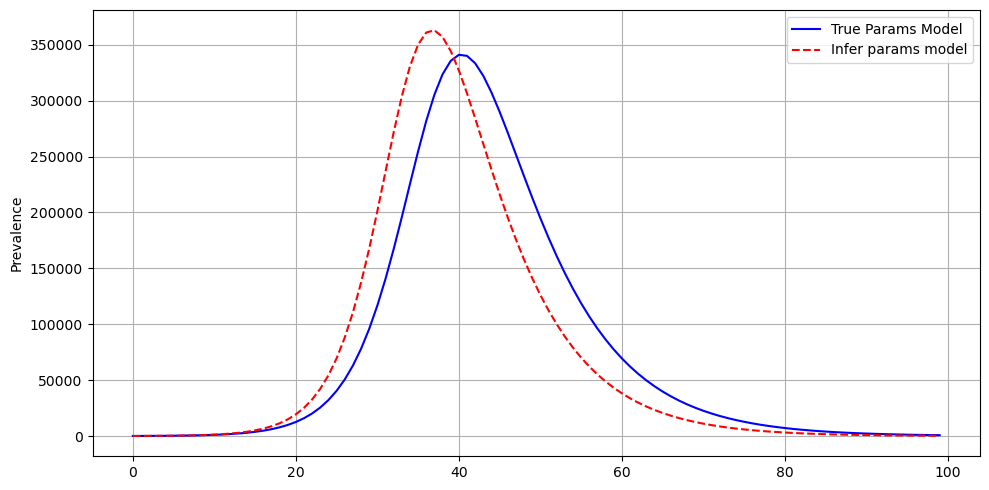

In [15]:
burn_in = 1000
mean_estimates = np.mean(samples[:, -burn_in:, :], axis=(0, 1))
std_estimates = np.std(samples[:, -burn_in:, :], axis=(0, 1))

beta_sampled, gamma_sampled, I0_sampled, scale_sampled = mean_estimates

# Creazione DataFrame pandas
df_results = pd.DataFrame({
    'Parameter': param_names,
    'True Value': true_params,
    'Inferred Mean': mean_estimates,
    'Std Dev': std_estimates
})

# Mostra DataFrame
print(df_results)
    
# ---- GENERIAMO LE DUE SIMULAZIONI ----
I_true_model = sir_discrete(*true_params, t_max, N)
I_sampled_model = sir_discrete(beta_sampled, gamma_sampled, I0_sampled, scale_sampled, t_max, N)

# ---- PLOT CONFRONTO ----
figure = plt.figure(figsize = (10, 5))
# Plot Infected Cases
plt.plot(I_true_model, label="True Params Model", color="blue")
plt.plot(I_sampled_model, label="Infer params model", color="red", linestyle="dashed")
plt.ylabel("Prevalence")
plt.legend()
plt.grid()

fig.suptitle("Comparison between true params model and infer params model")
plt.tight_layout()
plt.show()

As we can observe, the final values are compatible with the true values. Also, the inferred model is following the theoretical one in a significant way.

## MCMC sampling using PYMC

In this subsection, we have solved the problem using the **PYMC** library. It is a Python library for Bayesian inference, using Markov Chain Monte Carlo sampling to estimate posterior probability distributions in complex statistical models.
PyMC uses **No-U-Turn-Sampler (NUTS)** to generate samples from the posterior distribution. This allows estimating parameters and their uncertainties based on the data.

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (10 chains in 10 jobs)
NUTS: [beta, gamma, I0, scale]


Output()

Sampling 10 chains for 1_000 tune and 4_000 draw iterations (10_000 + 40_000 draws total) took 62 seconds.


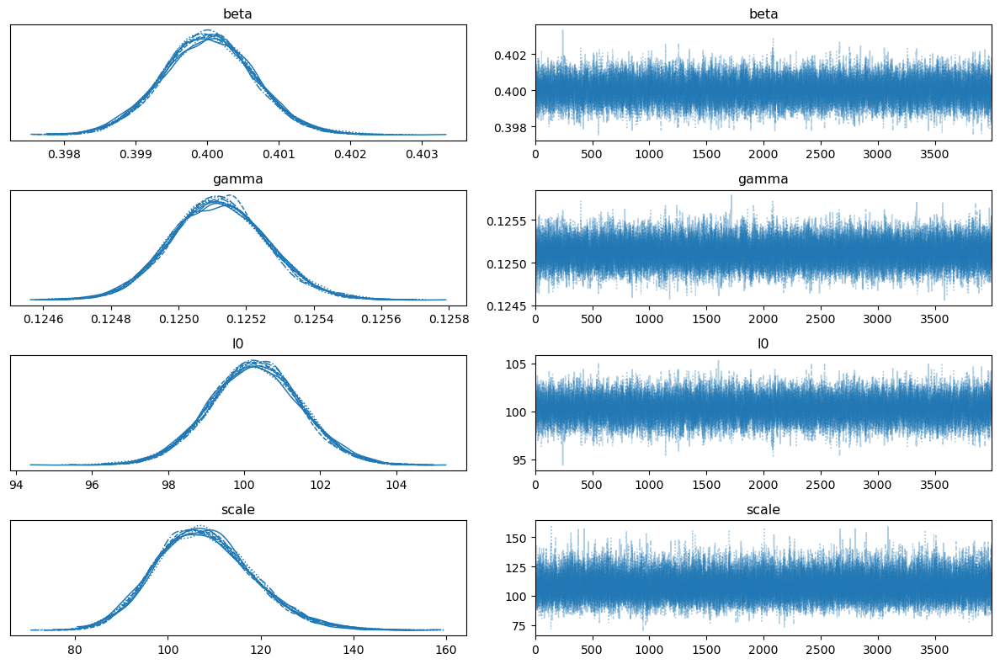

In [18]:
def sir_model_pytensor(beta, gamma, N, I0, t):
    
    def step(_, S, I, R, beta, gamma, N):
        dSdt = -beta * S * I / N
        dIdt = beta * S * I / N - gamma * I
        dRdt = gamma * I
        S_new = S + dSdt
        I_new = I + dIdt
        R_new = R + dRdt
        return S_new, I_new, R_new

    S0 = pt.cast(N - I0, "float64")  
    R0 = pt.cast(0, "float64")  
    I0 = pt.cast(I0, "float64")  

    outputs, _ = pytensor.scan(fn=step, sequences=t, outputs_info=[S0, I0, R0], non_sequences=[beta, gamma, N])
    
    return outputs[1]  

# ---- SIMULATE DATA ----
true_params = [0.4, 1/8, 100, 100]  
N = 1e5
t = np.linspace(0, 100, 100)  

# ---- TEST CON PARAMETRI VERI ----
beta_true, gamma_true, I0_true, scale_true = true_params
t_t = pt.as_tensor_variable(t)

# Convertiamo in PyTensor
beta_t = pt.as_tensor_variable(beta_true)
gamma_t = pt.as_tensor_variable(gamma_true)
I0_t = pt.as_tensor_variable(I0_true)

# Eseguiamo il modello una sola volta con i parametri veri
I_test = sir_model_pytensor(beta_t, gamma_t, N, I0_t, t_t)

# Compiliamo ed eseguiamo il calcolo con PyTensor
f = pytensor.function([], I_test)
I_true = f()
df_t = 4  
I_obs = I_true + stats.t.rvs(df=df_t, loc=0, scale=true_params[3], size=len(t))

# ---- BAYESIAN MODEL ----
with pm.Model() as model:
    # Priors
    beta = pm.Lognormal("beta", mu=np.log(0.4), sigma=0.5)
    gamma = pm.Lognormal("gamma", mu=np.log(1/8), sigma=0.2)
    I0 = pm.HalfCauchy("I0", beta=200)
    scale = pm.HalfCauchy("scale", beta=10)

    # Convertiamo le variabili in tensori `PyTensor`
    beta_t = pt.as_tensor_variable(beta)
    gamma_t = pt.as_tensor_variable(gamma)
    I0_t = pt.as_tensor_variable(I0)
    t_t = pt.as_tensor_variable(t)

    # SIR model in PyTensor
    I_pred =  sir_model_pytensor(beta_t, gamma_t, N, I0_t, t_t)

    # Likelihood (data model)
    pm.StudentT("obs", nu=4, mu=I_pred, sigma=scale, observed=I_obs)

    # Sampling
    trace = pm.sample(4000, tune=1000, cores=10, return_inferencedata=True, target_accept=0.9)

# ---- PLOT RESULTS ----
pm.plot_trace(trace)
plt.tight_layout()
plt.show()


In [19]:
# Genera il summary
summary = az.summary(trace)

summary

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta,0.400,0.001,0.399,0.401,0.000,0.000,11008.0,15337.0,1.0
gamma,0.125,0.000,0.125,0.125,0.000,0.000,14264.0,17840.0,1.0
I0,100.296,1.201,98.076,102.596,0.011,0.008,11329.0,16230.0,1.0
scale,108.032,10.599,89.162,128.545,0.074,0.052,20937.0,20966.0,1.0


As in the previous case, the inferred values are compatible with the theoretical one.

# SIR model with delay introduction (no switches)

The same model structure is employed also in this case. The main difference is the introduction of the **delay** parameter, that is actually representing the reporting delay between the new infections and the newly reported cases. The parameters that are going to be used are:

| Parameter         | Variable | Prior distribution                 |
|------------------|---------|-----------------------------------|
| Spreading rate  | \( $\lambda$ \) | LogNormal[log(0.4), 0.5]       |
| Recovery rate   | \( $\mu$ \)     | LogNormal[log(1/8), 0.2]       |
| Reporting delay | \( D \)       | LogNormal[log(8), 0.2]         |
| Initially infected | \( $I_0$ \) | HalfCauchy(100)                |
| Scale factor    | \( $\sigma$ \)  | HalfCauchy(10)                 |


In [23]:
from SIR_functions import sir_discrete_delay_no_switch

# ---- PARAMETERS ----
N = 1e6  # Population size
t_max = 100  # Total days of simulation
# Priors
N = 1e6
sigma_beta, mu_beta = 0.5, np.log(0.4)
sigma_gamma, mu_gamma = 0.2, np.log(1/8)
sigma_delay, mu_delay = 0.2, np.log(8)
sigma_I0 = 100
sigma_scale = 10

# ---- PRIOR FUNCTION ----
def log_prior(beta, gamma, delay, I0, scale):
    logp = (
        stats.lognorm.logpdf(beta, s=0.5, scale=np.exp(np.log(0.4))) +
        stats.lognorm.logpdf(gamma, s=0.2, scale=np.exp(np.log(1/8))) +
        stats.lognorm.logpdf(delay, s=0.2, scale=np.exp(np.log(8))) +
        stats.halfcauchy.logpdf(I0, scale=100) +
        stats.halfcauchy.logpdf(scale, scale=10)
    )
    return logp

# ---- LOG-LIKELIHOOD ----
def log_likelihood(params, data):
    beta, gamma, delay, I0, scale = params
    I_pred, C_pred = sir_discrete_delay_no_switch(beta, gamma, delay, I0, scale, t_max, N)  # Solve SIR model with delay
    
    # Likelihood: Assume reported cases C_t follows Normal(C_pred, scale)
    return np.sum(stats.norm.logpdf(data, loc=C_pred, scale=scale))

# ---- LOG-POSTERIOR ----
def log_posterior(params, data):
    beta, gamma, delay, I0, scale = params
    prior = log_prior(beta, gamma, delay, I0, scale)
    if np.isinf(prior) or np.isnan(prior):
        return -np.inf  # Reject invalid samples
    return prior + log_likelihood(params, data)

n_chains = 15 
# ---- SIMULATE DATA ----
true_params = [0.4, 1/8, 8, 100, 2]  # True values for beta, gamma, delay, I0, scale
I_true, C_true = sir_discrete_delay_no_switch(*true_params, t_max, N)  # Generate true epidemic curve
C_true += np.random.normal(0, true_params[4], size=t_max)  # Add noise

# ---- RUN MCMC ----
initial_guess = [0.8, 0.05, 5, 100, 1.5]  # Initial parameter guess

initial_params_list = [
    initial_guess + np.random.normal(0, [0.02, 0.02, 2, 2, 0.2], 5)
    for _ in range(n_chains)
]

step_sizes_list = [
    np.array([0.01, 0.02, 2, 1, 0.05]) + np.random.uniform(-0.005, 0.005, 5)
    for _ in range(n_chains)
]

samples = metropolis_hastings_multi_chain(log_posterior, initial_params_list, step_sizes_list, C_true, n_iter=20000, n_chains=n_chains)


Running chain 1/15...


/Users/annagarbo/Desktop/Info_theory_covid/SIR_functions.py:284: RuntimeWarning: overflow encountered in exp
  accept_ratio = np.exp(logp_new - logp_old)


Running chain 2/15...
Running chain 3/15...
Running chain 4/15...
Running chain 5/15...
Running chain 6/15...
Running chain 7/15...
Running chain 8/15...
Running chain 9/15...
Running chain 10/15...
Running chain 11/15...
Running chain 12/15...
Running chain 13/15...
Running chain 14/15...
Running chain 15/15...


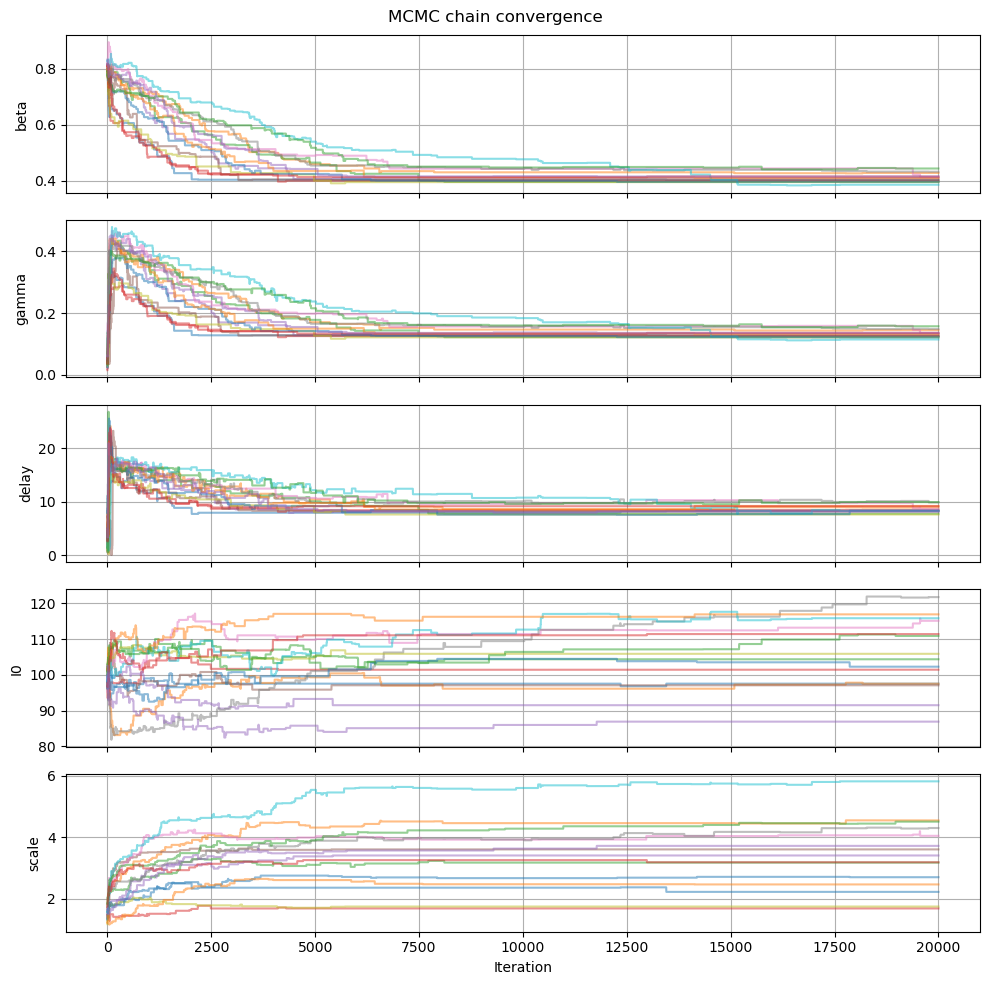

In [24]:
# ---- PLOT RESULTS IN SUBPLOTS ----
param_names = ["beta", "gamma", "delay", "I0", "scale"]
fig, axes = plt.subplots(len(param_names), 1, figsize=(10, 2 * len(param_names)), sharex=True)

for i, ax in enumerate(axes):
    for chain in samples:
        ax.plot(chain[:, i], alpha=0.5)
    ax.set_ylabel(param_names[i])
    ax.grid()

axes[-1].set_xlabel("Iteration")
plt.suptitle("MCMC chain convergence")
plt.tight_layout()
plt.show()

  Parameter  True Value  Inferred Mean   Std Dev
0      beta       0.400       0.410238  0.016095
1     gamma       0.125       0.132615  0.011954
2     delay       8.000       8.642010  0.715259
3        I0     100.000     105.024343  9.680260
4     scale       2.000       3.408830  1.102147


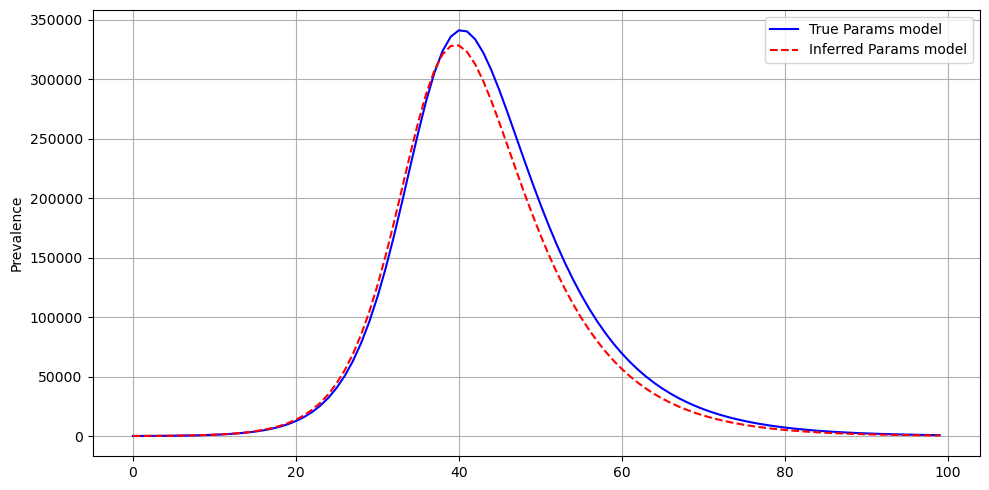

In [25]:
burn_in = 1000
mean_estimates = np.mean(samples[:, -burn_in:, :], axis=(0, 1))
std_estimates = np.std(samples[:, -burn_in:, :], axis=(0, 1))

beta_sampled, gamma_sampled, delay_sampled, I0_sampled, scale_sampled = mean_estimates

# Creazione DataFrame pandas
df_results = pd.DataFrame({
    'Parameter': param_names,
    'True Value': true_params,
    'Inferred Mean': mean_estimates,
    'Std Dev': std_estimates
})

# Mostra DataFrame
print(df_results)
    
# ---- GENERIAMO LE DUE SIMULAZIONI ----
I_true_model, C_true_model = sir_discrete_delay_no_switch(*true_params, t_max, N)
I_sampled_model, C_sampled_model = sir_discrete_delay_no_switch(beta_sampled, gamma_sampled, delay_sampled, I0_sampled, scale_sampled, t_max, N)

# ---- PLOT CONFRONTO ----
figure = plt.figure(figsize = (10, 5))
# Plot Infected Cases
plt.plot(I_true_model, label="True Params model", color="blue")
plt.plot(I_sampled_model, label="Inferred Params model", color="red", linestyle="dashed")
plt.ylabel("Prevalence")
plt.legend()
plt.grid()

fig.suptitle("Comparison between True Params model and Inferred Params model")
plt.tight_layout()
plt.show()

The delay is actually introducing some noise in the model, making the prediction for the algorithm harder.

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta, gamma, I0, delay, scale_delay, scale]


Output()

Sampling 4 chains for 500 tune and 2_000 draw iterations (2_000 + 8_000 draws total) took 684 seconds.


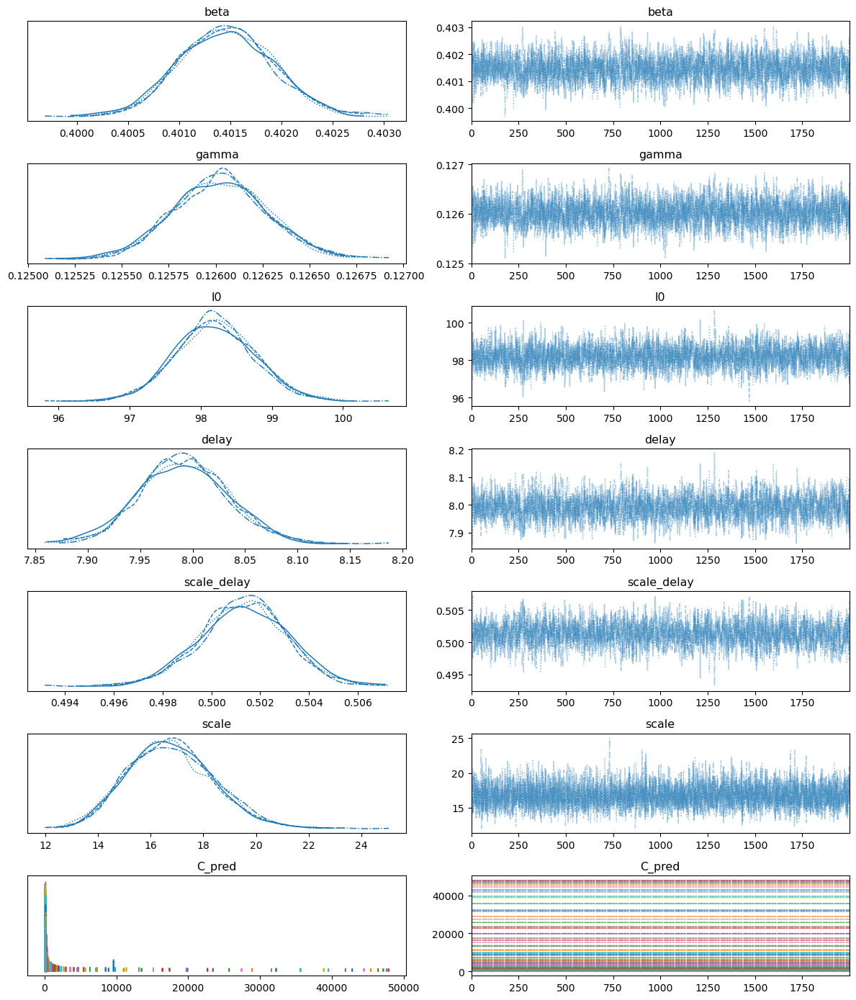

In [27]:
from SIR_functions import pt_lognormal, make_delay_matrix, apply_delay, delay_cases_lognormal 

# ---- SIR MODEL ----
def sir_model_pytensor(beta, gamma, N, I0, t_max):

    def step(_, S, I, R, I_new, beta, gamma, N):
        dSdt = -beta * S * I / N
        dIdt = beta * S * I / N - gamma * I
        dRdt = gamma * I
        S_new = S + dSdt
        I_new = I + dIdt
        R_new = R + dRdt
        return S_new, I_new, R_new, -dSdt

    S0 = pt.cast(N - I0, "float64")
    R0 = pt.cast(0, "float64")
    I0 = pt.cast(I0, "float64")
    I_new0 = pt.cast(0, "float64")

    outputs, _ = pytensor.scan(fn=step, sequences=pt.arange(t_max),
                               outputs_info=[S0, I0, R0, I_new0],
                               non_sequences=[beta, gamma, N])

    return outputs[3]  # nuovi infetti giornalieri


# ---- SIMULAZIONE DATI ----
true_params = {"beta": 0.4, "gamma": 1/8, "I0": 100, "scale": 10, "delay": 8, "scale_delay": 0.5}
N = 1e6
t_max = 100

# SIR deterministico
I_new_true = sir_model_pytensor(true_params["beta"], true_params["gamma"], N, true_params["I0"], t_max)
f = pytensor.function([], [I_new_true])
I_new_true = f()[0]

# Ritardo osservativo lognormale
lognorm_kernel_sim = stats.lognorm.pdf(make_delay_matrix(t_max, t_max), s=true_params["scale_delay"], scale=true_params["delay"])
lognorm_kernel_sim /= lognorm_kernel_sim.sum(axis=1, keepdims=True)
C_obs = np.dot(I_new_true, lognorm_kernel_sim)

# Rumore osservativo t-Student
C_obs += stats.t.rvs(df=5, loc=0, scale=true_params["scale"], size=len(C_obs))

# ---- MODELLO BAYESIANO PyMC ----
with pm.Model() as model:
    beta = pm.Lognormal("beta", mu=np.log(0.4), sigma=0.5)
    gamma = pm.Lognormal("gamma", mu=np.log(1/8), sigma=0.2)
    I0 = pm.HalfCauchy("I0", beta=100)
    delay = pm.Lognormal("delay", mu=np.log(8), sigma=0.5)
    scale_delay = pm.HalfNormal("scale_delay", sigma=1)

    I_new_pred = sir_model_pytensor(beta, gamma, N, I0, t_max)
    C_pred = pm.Deterministic("C_pred", delay_cases_lognormal(I_new_pred, t_max, t_max, delay, scale_delay))

    scale = pm.HalfCauchy("scale", beta=10)
    pm.StudentT("obs", nu=5, mu=C_pred, sigma=scale, observed=C_obs)

    trace = pm.sample(2000, tune=500, cores=4, target_accept=0.9)

az.plot_trace(trace)
plt.tight_layout()
plt.show()




In [28]:
summary = az.summary(trace)
summary
#print(summary.tail(6))

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta,0.401,0.000,0.401,0.402,0.000,0.000,2146.0,2694.0,1.0
gamma,0.126,0.000,0.126,0.126,0.000,0.000,2293.0,3056.0,1.0
I0,98.201,0.559,97.147,99.240,0.011,0.008,2385.0,3452.0,1.0
delay,7.992,0.042,7.918,8.077,0.001,0.001,1783.0,2402.0,1.0
scale_delay,0.501,0.002,0.498,0.505,0.000,0.000,1800.0,2622.0,1.0
...,...,...,...,...,...,...,...,...,...
C_pred[95],80.797,0.448,79.960,81.653,0.010,0.007,1870.0,2428.0,1.0
C_pred[96],71.681,0.410,70.916,72.462,0.009,0.007,1872.0,2420.0,1.0
C_pred[97],63.613,0.375,62.914,64.330,0.009,0.006,1876.0,2432.0,1.0
C_pred[98],56.470,0.343,55.830,57.126,0.008,0.006,1879.0,2420.0,1.0


# SIR model with one switch

We are going to assume now that the spreading rate $\beta$ may change at ceratin time points $t_i$ from $\beta_{i-1}$ to $\beta_b$ linearly over a time window of $\Delta t_i$ days. In this way, we are taking into account for mitigation measures applied to contrast the spreading of the pandemic, such as the closing of markets and public spaces.

The new model will be characterized by:

| Parameter          | Variable   | Prior distribution              |
|-------------------|-----------|--------------------------------|
| Change point      | \( $t_1$ \)  | Normal(2020/03/09, 3)         |
| Change duration   | \( $\Delta t$ \) | LogNormal(log(3), 0.3)   |
| Spreading rates   | \( $\beta_0$ \) | LogNormal(log(0.4), 0.5)  |
|                   | \( $\beta_1$ \) | LogNormal(log(0.2), 0.5)  |
| Recovery rate     | \( $\gamma$ \)  | LogNormal(log(1/8), 0.2)     |
| Initially infected | \( $I_0$ \)  | HalfCauchy(100)               |
| Scale factor      | \( $\sigma$ \)  | HalfCauchy(10)                |

In this first case, the reporting delay will be omitted.


In [31]:
# ---- LOG-POSTERIOR ----
def log_posterior(params, data):
    beta_before, beta_after, gamma, I0, scale = params
    prior = log_prior(beta_before, beta_after, gamma, I0, scale)
    if np.isinf(prior) or np.isnan(prior):
        return -np.inf  # Reject invalid samples
    return prior + log_likelihood(params, data)

Running chain 1/20...


/Users/annagarbo/Desktop/Info_theory_covid/SIR_functions.py:284: RuntimeWarning: overflow encountered in exp
  accept_ratio = np.exp(logp_new - logp_old)


Running chain 2/20...
Running chain 3/20...
Running chain 4/20...
Running chain 5/20...
Running chain 6/20...
Running chain 7/20...
Running chain 8/20...
Running chain 9/20...
Running chain 10/20...
Running chain 11/20...
Running chain 12/20...
Running chain 13/20...
Running chain 14/20...
Running chain 15/20...
Running chain 16/20...
Running chain 17/20...
Running chain 18/20...
Running chain 19/20...
Running chain 20/20...


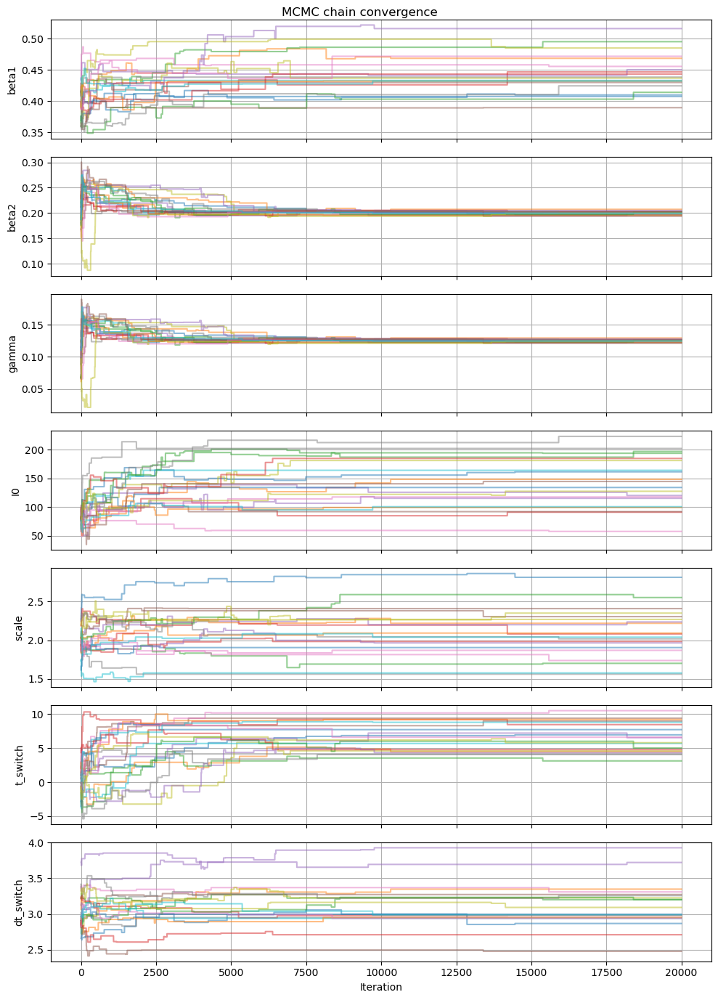

In [32]:
from SIR_functions import sir_discrete_single_switch 

# Parameters
N = 1e6 # population size 
t = np.linspace(0, 50, 50) # time grid 
t_max = 100
beta_before, beta_after = 0.4, 0.2

# Initial parameters for priors 
sigma_beta, mu_beta = 0.5, np.log(0.4)
sigma_beta_2, mu_beta_2 = 0.5, np.log(0.2)
sigma_gamma, mu_gamma = 0.2, np.log(1/8) # \ \ 0.2 
sigma_I0 = 100
sigma_scale = 10
sigma_t, mu_t =  3,14
sigma_dt, mu_dt = 0.3, np.log(3)

# Modello con le prior del paper 
def log_prior(beta_before, beta_after, gamma, I0, scale, t_switch, dt_switch):
    logp = (    
        stats.lognorm.logpdf(beta_before, s=sigma_beta, scale=np.exp(mu_beta)) +
        stats.lognorm.logpdf(beta_after, s=sigma_beta_2, scale=np.exp(mu_beta_2)) +
        stats.lognorm.logpdf(gamma, s=sigma_gamma, scale=np.exp(mu_gamma)) +
        stats.halfcauchy.logpdf(I0, scale=sigma_I0) +
        stats.halfcauchy.logpdf(scale, scale=sigma_scale) +
        stats.norm.logpdf(t_switch, loc=mu_t, scale=sigma_t) +
        stats.lognorm.logpdf(dt_switch, s = sigma_dt, scale = np.exp(mu_dt))
    )
    return logp

# ---- LOG-LIKELIHOOD ----
def log_likelihood(params, data):
    beta_before, beta_after, gamma, I0, scale, t_switch, dt_switch = params
    I_pred = sir_discrete_single_switch(beta_before, beta_after, gamma, I0, scale, t_switch, dt_switch, t_max, N)  # Solve SIR model with delay
    
    # Likelihood: Assume reported cases C_t follows Normal(C_pred, scale)
    return np.sum(stats.norm.logpdf(data, loc=I_pred, scale=scale))

# ---- LOG-POSTERIOR ----
def log_posterior(params, data):
    beta_before, beta_after, gamma, I0, scale, t_switch, dt_switch = params
    prior = log_prior(beta_before, beta_after, gamma, I0, scale, t_switch, dt_switch)
    if np.isinf(prior) or np.isnan(prior):
        return -np.inf  # Reject invalid samples
    return prior + log_likelihood(params, data)

# ---- MCMC (Metropolis-Hastings) ----
def metropolis_hastings(log_posterior, initial_params, data, n_iter=5000, step_sizes=None):
    params = np.array(initial_params)
    samples = [params]
    if step_sizes is None:
        step_sizes = np.array([0.01, 0.05, 0.05, 10, 0.05, 0.5, 0.05])  # Larger step for delay and I0
    
    for _ in range(n_iter):
        proposal = params + np.random.normal(0, step_sizes, size=len(params))
        
        logp_old = log_posterior(params, data)
        logp_new = log_posterior(proposal, data)
        
        accept_ratio = np.exp(logp_new - logp_old)
        if np.random.rand() < accept_ratio:
            params = proposal  # Accept proposal
        
        samples.append(params)
    
    return np.array(samples)

n_chains = 20
# ---- SIMULATE DATA ----
true_params = [0.4, 0.2, 1/8, 100, 2, 10, 3]  # True values for beta1, beta2, gamma, I0, scale, switch point, dt
I_true = sir_discrete_single_switch(*true_params, t_max, N)  # Generate true epidemic curve
I_true += np.random.normal(0, true_params[-2], size=t_max)  # Add noise

# ---- RUN MCMC ----
initial_guess = [0.4, 0.2, 0.1, 80, 2, 1, 3]  # Initial parameter guess

initial_params_list = [
    initial_guess + np.random.normal(0, [0.02, 0.02, 0.02, 2, 0.2, 2, 0.2], 7)
    for _ in range(n_chains)
]

step_sizes_list = [
    np.array([0.01, 0.02, 0.02, 10, 0.05, 1, 0.05]) + np.random.uniform(-0.005, 0.005, 7)
    for _ in range(n_chains)
]

samples = metropolis_hastings_multi_chain(log_posterior, initial_params_list, step_sizes_list, I_true, n_iter=20000, n_chains=n_chains)

# ---- PLOT RESULTS IN SUBPLOTS ----
param_names = ["beta1", "beta2", "gamma", "I0", "scale", "t_switch", "dt_switch"]
fig, axes = plt.subplots(len(param_names), 1, figsize=(10, 2 * len(param_names)), sharex=True)

for i, ax in enumerate(axes):
    for chain in samples:
        ax.plot(chain[:, i], alpha=0.5)
    ax.set_ylabel(param_names[i])
    ax.grid()

axes[-1].set_xlabel("Iteration")
plt.suptitle("MCMC chain convergence")
plt.tight_layout()
plt.show()

   Parameter  True Value  Inferred Mean    Std Dev
0      beta1       0.400       0.444057   0.030484
1      beta2       0.200       0.200612   0.003145
2      gamma       0.125       0.125349   0.001900
3         I0     100.000     143.044112  43.606226
4      scale       2.000       2.084534   0.312237
5   t_switch      10.000       6.452109   2.122752
6  dt_switch       3.000       3.117732   0.315726


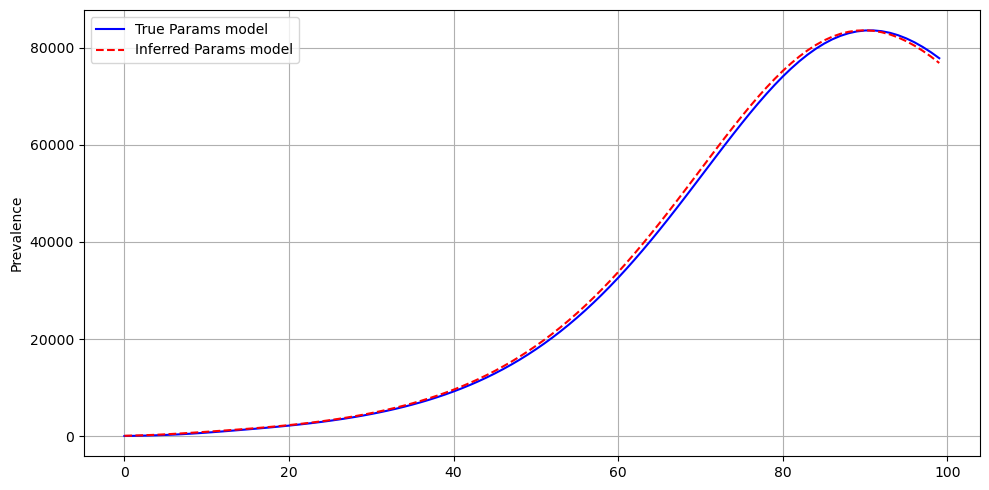

In [33]:
burn_in = 1000
mean_estimates = np.mean(samples[:, -burn_in:, :], axis=(0, 1))
std_estimates = np.std(samples[:, -burn_in:, :], axis=(0, 1))

beta1_sampled, beta2_sampled, gamma_sampled, I0_sampled, scale_sampled, t_switch_sampled, dt_switched_sampled = mean_estimates

# Creazione DataFrame pandas
df_results = pd.DataFrame({
    'Parameter': param_names,
    'True Value': true_params,
    'Inferred Mean': mean_estimates,
    'Std Dev': std_estimates
})

# Mostra DataFrame
print(df_results)
    
# ---- GENERIAMO LE DUE SIMULAZIONI ----
I_true_model = sir_discrete_single_switch(*true_params, t_max, N)
I_sampled_model = sir_discrete_single_switch(*mean_estimates, t_max, N)

# ---- PLOT CONFRONTO ----
figure = plt.figure(figsize = (10, 5))
# Plot Infected Cases
plt.plot(I_true_model, label="True Params model", color="blue")
plt.plot(I_sampled_model, label="Inferred Params model", color="red", linestyle="dashed")
plt.ylabel("Prevalence")
plt.legend()
plt.grid()

fig.suptitle("Comparison between True Params Model and Inferred params model")
plt.tight_layout()
plt.show()

c:\ProgramData\anaconda3\lib\site-packages\pytensor\link\c\cmodule.py:2959: UserWarning: PyTensor could not link to a BLAS installation. Operations that might benefit from BLAS will be severely degraded.
This usually happens when PyTensor is installed via pip. We recommend it be installed via conda/mamba/pixi instead.
Alternatively, you can use an experimental backend such as Numba or JAX that perform their own BLAS optimizations, by setting `pytensor.config.mode == 'NUMBA'` or passing `mode='NUMBA'` when compiling a PyTensor function.
For more options and details see https://pytensor.readthedocs.io/en/latest/troubleshooting.html#how-do-i-configure-test-my-blas-library
  warnings.warn(
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta1, beta2, transient_begin_0, transient_len_0, gamma, I0, scale]


Output()

Sampling 4 chains for 1_000 tune and 3_000 draw iterations (4_000 + 12_000 draws total) took 6269 seconds.


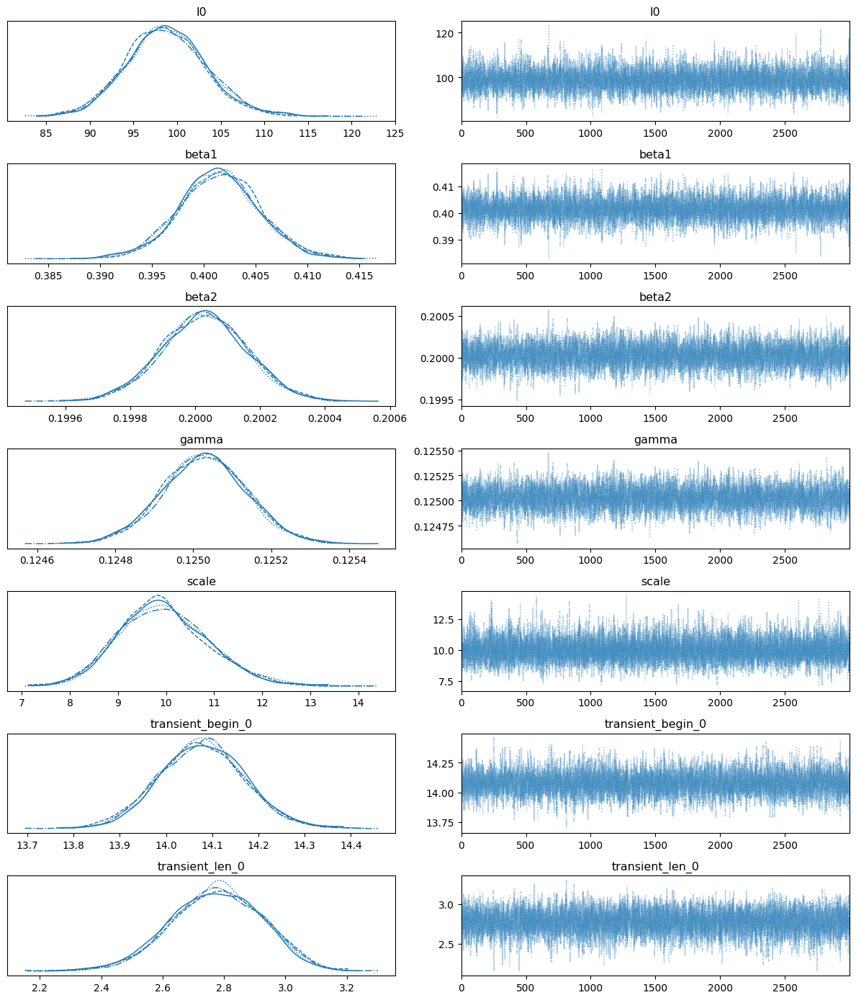

In [3]:
from SIR_functions import smooth_step_function, pt_lognormal, make_delay_matrix, apply_delay, delay_cases_lognormal, _SIR_model

true_params = {"beta1": 0.4, "beta2": 0.2, "gamma": 1/8, "I0": 100, "scale": 10, "delay": 8, "scale_delay": 0.5}
N = 1e6
t_max = 100
S = N - true_params["I0"]
t = np.linspace(0, 50, 50)
lambda_list = [0.4, 0.2]
num_days_sim = 100
tr_begin_list = [14] #[datetime(2020, 3, 9) + timedelta(days=7)]
tr_len_list = [3]

# --------------------------------------------------------------------------------------------
    # build the time-dependent spreading rate
lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
lambda_before = lambda_list[0]
for tr_begin, tr_len, lambda_after in zip(
    tr_begin_list, tr_len_list, lambda_list[1:]
):
    lambda_t = smooth_step_function(
        start_val=0,
        end_val=1,
        t_begin=tr_begin,
        t_end=tr_begin + tr_len,
        t_total=num_days_sim,
    ) * (lambda_after - lambda_before)
    lambda_before = lambda_after
    lambda_t_list.append(lambda_t)

lambda_t = sum(lambda_t_list)
lambda_t = lambda_t.astype("float64")
# ----------------------------------------------------------------------------------------------

S = np.float64(S)
N = np.float64(N)  # Se è un intero, lo converto esplicitamente a float
I0 = np.float64(true_params["I0"])
mu = np.float64(true_params["gamma"])
_, _, I_new_true = _SIR_model(lambda_t, mu, S, I0, N)

f = pytensor.function([], [I_new_true])
I_new_true = f()[0]

# Rumore osservativo t-Student
I_obs = I_new_true + stats.t.rvs(df=4, loc=0, scale=true_params["scale"], size=len(I_new_true))

date_begin_simulation = datetime(2020, 3, 2)
#change_points_list = [7] # changing point at day 7 

change_points_list = [
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 2) + timedelta(days=14),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 0.4,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 3,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    }
]

# ---- MODELLO BAYESIANO PyMC ----
with pm.Model() as model:
    beta1 = pm.Lognormal("beta1", mu=np.log(0.4), sigma=0.5)
    beta2 = pm.Lognormal("beta2", mu = np.log(0.2), sigma = 0.5)

    lambda_list = [beta1, beta2]

    # list of start dates of the transient periods of the change points
    tr_begin_list = []
    dt_before = date_begin_simulation
    for i, cp in enumerate(change_points_list):
        dt_begin_transient = cp["pr_mean_date_begin_transient"]
        if dt_before is not None and dt_before > dt_begin_transient:
            raise RuntimeError("Dates of change points are not temporally ordered")
        prior_mean = (
            dt_begin_transient - date_begin_simulation).days   # convert the provided date format (argument) into days (a number)
        tr_begin = pm.Normal(
            name=f"transient_begin_{i}",
            mu=prior_mean,
            sigma=cp["pr_sigma_date_begin_transient"],
        )
        tr_begin_list.append(tr_begin)
        dt_before = dt_begin_transient
    # same for transient times
    tr_len_list = []
    for i, cp in enumerate(change_points_list):
        tr_len = pm.Lognormal(
            name=f"transient_len_{i}",
            mu=np.log(cp["pr_median_transient_len"]),
            sigma=cp["pr_sigma_transient_len"],
        )
        tr_len_list.append(tr_len)
    # build the time-dependent spreading rate
    lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
    lambda_before = lambda_list[0]

    for tr_begin, tr_len, lambda_after in zip(
        tr_begin_list, tr_len_list, lambda_list[1:]
    ):
        lambda_t = smooth_step_function(
            start_val=0,
            end_val=1,
            t_begin=tr_begin,
            t_end=tr_begin + tr_len,
            t_total=num_days_sim,
        ) * (lambda_after - lambda_before)
        lambda_before = lambda_after
        lambda_t_list.append(lambda_t)
    lambda_t = sum(lambda_t_list)
    
    gamma = pm.Lognormal("gamma", mu=np.log(1/8), sigma=0.2)
    I0 = pm.HalfCauchy("I0", beta=100)
    #delay = pm.Lognormal("delay", mu=np.log(8), sigma=0.5)
    #scale_delay = pm.HalfNormal("scale_delay", sigma=1)
    scale = pm.HalfCauchy("scale", beta=10)

    S_begin = N - I0
    S, I, new_I = _SIR_model(
        lambda_t=lambda_t, mu=gamma, S_begin=S_begin, I_begin=I0, N=N
    )

    num_days_data = new_I.shape[-1]
    pm.StudentT("obs",
                 nu=4,
                 mu=new_I[:num_days_data],
                 sigma= scale, 
                 observed=I_obs)

    trace = pm.sample(3000, tune=1000, cores=4, chains=4, target_accept=0.85)


 
az.plot_trace(trace)
plt.tight_layout()
plt.show()

In [5]:
summary=pm.summary(trace)
summary

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
I0,98.773,4.637,90.028,107.379,0.065,0.046,5135.0,5442.0,1.0
beta1,0.401,0.004,0.394,0.409,0.000,0.000,5109.0,5406.0,1.0
beta2,0.200,0.000,0.200,0.200,0.000,0.000,5520.0,6248.0,1.0
gamma,0.125,0.000,0.125,0.125,0.000,0.000,5440.0,6014.0,1.0
scale,9.963,0.944,8.172,11.692,0.011,0.008,7341.0,6622.0,1.0
transient_begin_0,14.078,0.093,13.905,14.253,0.001,0.001,5167.0,5685.0,1.0
transient_len_0,2.776,0.149,2.506,3.054,0.002,0.001,5498.0,5858.0,1.0


# SIR model with 1 switch and delay introduction

In this extended version of the SIR model with 1 switch, we are going to take into account also for a reporting delay.

| Parameter          | Variable   | Prior distribution              |
|-------------------|-----------|--------------------------------|
| Change point      | \( $t_1$ \)  | Normal(2020/03/09, 3)         |
| Change duration   | \( $\Delta t$ \) | LogNormal(log(3), 0.3)   |
| Spreading rates   | \( $\beta_0$ \) | LogNormal(log(0.4), 0.5)  |
|                   | \( $\beta_1$ \) | LogNormal(log(0.2), 0.5)  |
| Recovery rate     | \( $\gamma$ \)  | LogNormal(log(1/8), 0.2)     |
| Reporting delay   | \( D \)  | LogNormal(log(8), 0.2)       |
| Initially infected | \( $I_0$ \)  | HalfCauchy(100)               |
| Scale factor      | \( $\sigma$ \)  | HalfCauchy(10)                |

Running chain 1/20...


/Users/annagarbo/Desktop/Info_theory_covid/SIR_functions.py:284: RuntimeWarning: overflow encountered in exp
  accept_ratio = np.exp(logp_new - logp_old)


Running chain 2/20...
Running chain 3/20...
Running chain 4/20...
Running chain 5/20...
Running chain 6/20...
Running chain 7/20...
Running chain 8/20...
Running chain 9/20...
Running chain 10/20...
Running chain 11/20...
Running chain 12/20...
Running chain 13/20...
Running chain 14/20...
Running chain 15/20...
Running chain 16/20...
Running chain 17/20...
Running chain 18/20...
Running chain 19/20...
Running chain 20/20...


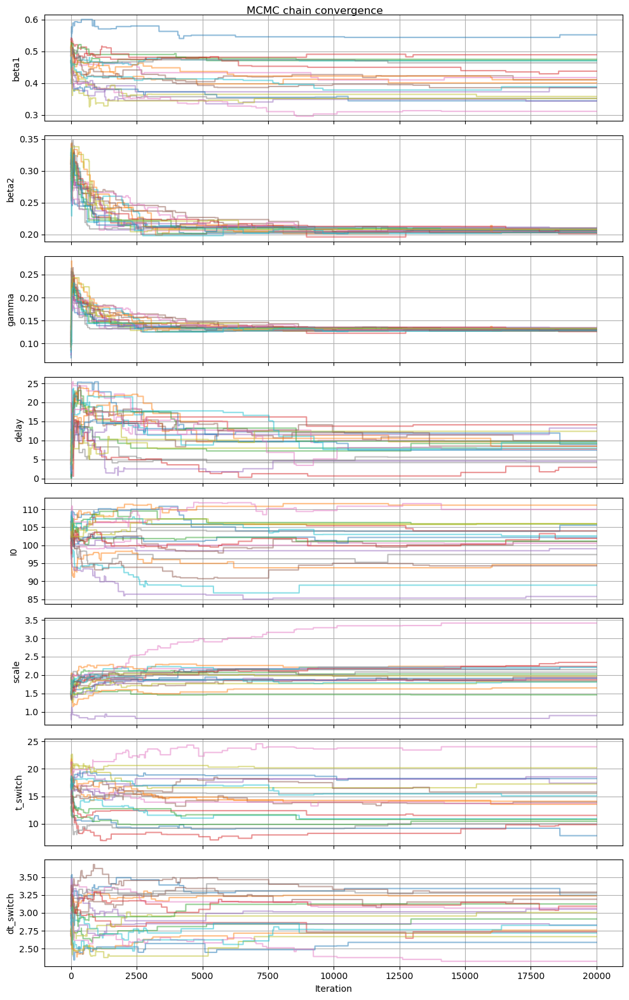

In [37]:
from SIR_functions import sir_discrete_delay_w_switch 

# ---- PARAMETERS ----
N = 1e6  # Population size
t_max = 100  # Total days of simulation
# Priors
N = 1e6
sigma_beta, mu_beta = 0.5, np.log(0.4)
sigma_beta_2, mu_beta_2 = 0.5, np.log(0.2)
sigma_gamma, mu_gamma = 0.2, np.log(1/8)
sigma_delay, mu_delay = 0.2, np.log(8)
sigma_I0 = 100
sigma_scale = 10
sigma_time, mu_time = 0.3, np.log(7)
sigma_dt, mu_dt = 0.3, np.log(3)

# ---- PRIOR FUNCTION ----
def log_prior(beta_before, beta_after, gamma, delay, I0, scale, t_switch, dt_switch):
    logp = (
        stats.lognorm.logpdf(beta_before, s=0.5, scale=np.exp(np.log(0.4))) +
        stats.lognorm.logpdf(beta_after, s=sigma_beta_2, scale=np.exp(mu_beta_2)) +
        stats.lognorm.logpdf(gamma, s=0.2, scale=np.exp(np.log(1/8))) +
        stats.lognorm.logpdf(delay, s=0.2, scale=np.exp(np.log(8))) +
        stats.halfcauchy.logpdf(I0, scale=100) +
        stats.halfcauchy.logpdf(scale, scale=10) +
        stats.norm.logpdf(t_switch, loc=mu_time, scale=sigma_time) +
        stats.lognorm.logpdf(dt_switch, s = sigma_dt, scale = np.exp(mu_dt))
    )
    return logp

# ---- LOG-LIKELIHOOD ----
def log_likelihood(params, data):
    beta_before, beta_after, gamma, delay, I0, scale, t_switch, dt_switch = params
    I_pred, C_pred = sir_discrete_delay_w_switch(beta_before, beta_after, gamma, delay, I0, scale, t_switch, dt_switch, t_max, N)  # Solve SIR model with delay
    
    # Likelihood: Assume reported cases C_t follows Normal(C_pred, scale)
    return np.sum(stats.norm.logpdf(data, loc=C_pred, scale=scale))

# ---- LOG-POSTERIOR ----
def log_posterior(params, data):
    beta_before, beta_after, gamma, delay, I0, scale, t_switch, dt_switch = params
    prior = log_prior(beta_before, beta_after, gamma, delay, I0, scale, t_switch, dt_switch)
    if np.isinf(prior) or np.isnan(prior):
        return -np.inf  # Reject invalid samples
    return prior + log_likelihood(params, data)

n_chains = 20
# ---- SIMULATE DATA ----
true_params = [0.4, 0.2, 1/8, 8, 100, 2, 14, 3]  # True values for beta, gamma, delay, I0, scale
I_true, C_true = sir_discrete_delay_w_switch(*true_params, t_max, N)  # Generate true epidemic curve
C_true += np.random.normal(0, true_params[4], size=t_max)  # Add noise

# ---- RUN MCMC ----
initial_guess = [0.5, 0.3, 0.1, 5, 103, 1.5, 17, 3]  # Initial parameter guess

initial_params_list = [
    initial_guess + np.random.normal(0, [0.02, 0.02, 0.02, 2, 2, 0.2, 2, 0.2], 8)
    for _ in range(n_chains)
]

step_sizes_list = [
    np.array([0.01, 0.01, 0.02, 2, 1, 0.05, 0.5, 0.05]) + np.random.uniform(-0.005, 0.005, 8)
    for _ in range(n_chains)
]

samples = metropolis_hastings_multi_chain(log_posterior, initial_params_list, step_sizes_list, C_true, n_iter=20000, n_chains=n_chains)

# ---- PLOT RESULTS IN SUBPLOTS ----
param_names = ["beta1", "beta2", "gamma", "delay", "I0", "scale", "t_switch","dt_switch"]
fig, axes = plt.subplots(len(param_names), 1, figsize=(10, 2 * len(param_names)), sharex=True)

for i, ax in enumerate(axes):
    for chain in samples:
        ax.plot(chain[:, i], alpha=0.5)
    ax.set_ylabel(param_names[i])
    ax.grid()

axes[-1].set_xlabel("Iteration")
plt.suptitle("MCMC chain convergence")
plt.tight_layout()
plt.show()


   Parameter  True Value  Inferred Mean   Std Dev
0      beta1       0.400       0.410930  0.059857
1      beta2       0.200       0.206283  0.002794
2      gamma       0.125       0.130348  0.002498
3      delay       8.000       8.589925  2.777439
4         I0     100.000     101.082728  6.257602
5      scale       2.000       2.002545  0.452374
6   t_switch      14.000      14.429448  3.950177
7  dt_switch       3.000       2.967208  0.274536


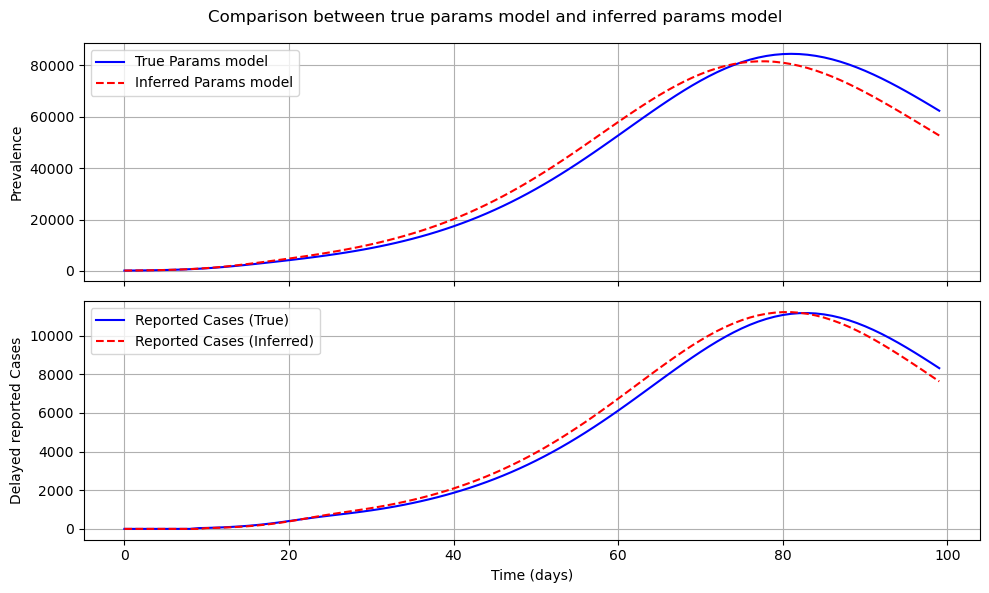

In [38]:
burn_in = 1000
mean_estimates = np.mean(samples[:, -burn_in:, :], axis=(0, 1))
std_estimates = np.std(samples[:, -burn_in:, :], axis=(0, 1))

beta1_sampled, beta2_sampled, gamma_sampled, delay_sampled, I0_sampled, scale_sampled, t_switch_sampled, dt_switch_sampled = mean_estimates

# Creazione DataFrame pandas
df_results = pd.DataFrame({
    'Parameter': param_names,
    'True Value': true_params,
    'Inferred Mean': mean_estimates,
    'Std Dev': std_estimates
})

# Mostra DataFrame
print(df_results)    
# ---- GENERIAMO LE DUE SIMULAZIONI ----
I_true_model, C_true_model = sir_discrete_delay_w_switch(*true_params, t_max, N)
I_sampled_model, C_sampled_model = sir_discrete_delay_w_switch(beta1_sampled, beta2_sampled, gamma_sampled, delay_sampled, I0_sampled, scale_sampled, t_switch_sampled, dt_switch_sampled, t_max, N)

# ---- PLOT CONFRONTO ----
fig, ax = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

# Plot Infected Cases
ax[0].plot(I_true_model, label="True Params model", color="blue")
ax[0].plot(I_sampled_model, label="Inferred Params model", color="red", linestyle="dashed")
ax[0].set_ylabel("Prevalence")
ax[0].legend()
ax[0].grid()

# Plot Reported Cases (con delay)
ax[1].plot(C_true_model, label="Reported Cases (True)", color="blue")
ax[1].plot(C_sampled_model, label="Reported Cases (Inferred)", color="red", linestyle="dashed")
ax[1].set_ylabel("Delayed reported Cases")
ax[1].set_xlabel("Time (days)")
ax[1].legend()
ax[1].grid()

fig.suptitle("Comparison between true params model and inferred params model")
plt.tight_layout()
plt.show()

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta1, beta2, transient_begin_0, transient_len_0, gamma, I0, delay, scale_delay, scale]


Output()

Sampling 4 chains for 500 tune and 2_000 draw iterations (2_000 + 8_000 draws total) took 2203 seconds.
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.


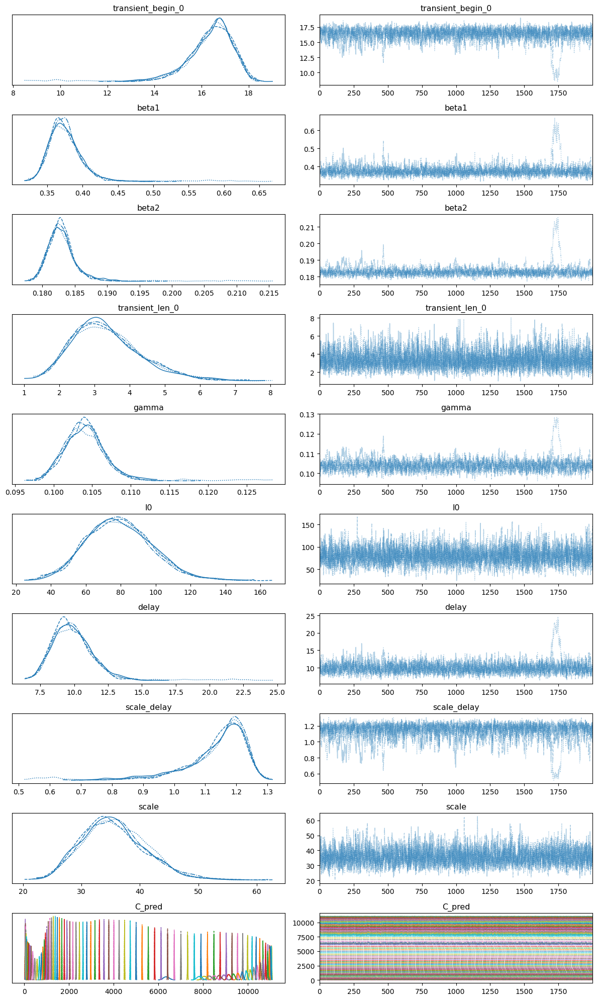

In [19]:
# SIR model with 1 switch and delay 
from SIR_functions import smooth_step_function, pt_lognormal, make_delay_matrix, apply_delay, delay_cases_lognormal, _SIR_model

# ---- SIMULAZIONE DATI ----
true_params = {"beta1": 0.4, "beta1": 0.2, "gamma": 1/8, "I0": 100, "scale": 10, "delay": 8, "scale_delay": 0.5}
N = 1e6
t_max = 100
S = N - true_params["I0"]
t = np.linspace(0, 100, 100)
lambda_list = [0.4, 0.2]
num_days_sim = 100
tr_begin_list = [14] #[datetime(2020, 3, 9) + timedelta(days=50)]
tr_len_list = [3]
# SIR deterministico

# --------------------------------------------------------------------------------------------
lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
lambda_before = lambda_list[0]
for tr_begin, tr_len, lambda_after in zip(
    tr_begin_list, tr_len_list, lambda_list[1:]
):
    lambda_t = smooth_step_function(
        start_val=0,
        end_val=1,
        t_begin=tr_begin,
        t_end=tr_begin + tr_len,
        t_total=num_days_sim,
    ) * (lambda_after - lambda_before)
    lambda_before = lambda_after
    lambda_t_list.append(lambda_t)

lambda_t = sum(lambda_t_list)
lambda_t = lambda_t.astype("float64")
# ----------------------------------------------------------------------------------------------

S = np.float64(S)
N = np.float64(N)  # Se è un intero, lo converto esplicitamente a float
I0 = np.float64(true_params["I0"])
mu = np.float64(true_params["gamma"])
_, _, I_new_true = _SIR_model(lambda_t, mu, S, I0, N)

f = pytensor.function([], [I_new_true])
I_new_true = f()[0]

# ----------------------------------------------
# Rumore osservativo t-Student
lognorm_kernel_sim = stats.lognorm.pdf(make_delay_matrix(t_max, t_max), s=true_params["scale_delay"], scale=true_params["delay"])
lognorm_kernel_sim /= lognorm_kernel_sim.sum(axis=1, keepdims=True)
C_obs = np.dot(I_new_true, lognorm_kernel_sim)

# Rumore osservativo t-Student
C_obs += stats.t.rvs(df=4, loc=0, scale=true_params["scale"], size=len(C_obs))

date_begin_simulation = datetime(2020, 3, 9)
change_points_list = [14] # changing point at day 50 

change_points_list = [
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 9) + timedelta(days=14),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 0.2,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 3,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    }
]

# ---- MODELLO BAYESIANO PyMC ----
with pm.Model() as model:
    beta1 = pm.Lognormal("beta1", mu=np.log(0.4), sigma=0.5)
    beta2 = pm.Lognormal("beta2", mu = np.log(0.2), sigma = 0.5)

    lambda_list = [beta1, beta2]

    # list of start dates of the transient periods of the change points
    tr_begin_list = []
    dt_before = date_begin_simulation
    for i, cp in enumerate(change_points_list):
        dt_begin_transient = cp["pr_mean_date_begin_transient"]
        if dt_before is not None and dt_before > dt_begin_transient:
            raise RuntimeError("Dates of change points are not temporally ordered")
        prior_mean = (
            dt_begin_transient - date_begin_simulation).days - 1  # convert the provided date format (argument) into days (a number)
        tr_begin = pm.Normal(
            name=f"transient_begin_{i}",
            mu=prior_mean,
            sigma=cp["pr_sigma_date_begin_transient"],
        )
        tr_begin_list.append(tr_begin)
        dt_before = dt_begin_transient
    # same for transient times
    tr_len_list = []
    for i, cp in enumerate(change_points_list):
        tr_len = pm.Lognormal(
            name=f"transient_len_{i}",
            mu=np.log(cp["pr_median_transient_len"]),
            sigma=cp["pr_sigma_transient_len"],
        )
        tr_len_list.append(tr_len)
    # build the time-dependent spreading rate
    lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
    lambda_before = lambda_list[0]

    for tr_begin, tr_len, lambda_after in zip(
        tr_begin_list, tr_len_list, lambda_list[1:]
    ):
        lambda_t = smooth_step_function(
            start_val=0,
            end_val=1,
            t_begin=tr_begin,
            t_end=tr_begin + tr_len,
            t_total=num_days_sim,
        ) * (lambda_after - lambda_before)
        lambda_before = lambda_after
        lambda_t_list.append(lambda_t)
    lambda_t = sum(lambda_t_list)
    
    gamma = pm.Lognormal("gamma", mu=np.log(1/8), sigma=0.2)
    I0 = pm.HalfCauchy("I0", beta=100)
    delay = pm.Lognormal("delay", mu=np.log(8), sigma=0.5)
    scale_delay = pm.HalfNormal("scale_delay", sigma=1)
    scale = pm.HalfCauchy("scale", beta=10)

    S_begin = N - I0
    S, I, new_I = _SIR_model(
        lambda_t=lambda_t, mu=gamma, S_begin=S_begin, I_begin=I0, N=N
    )
    C_pred = pm.Deterministic("C_pred", delay_cases_lognormal(new_I, t_max, t_max, delay, scale_delay))

    num_days_data = C_pred.shape[-1]
    pm.StudentT("obs",
                 nu=4,
                 mu=C_pred[:num_days_data],
                 sigma= scale, 
                 observed=C_obs)

    trace = pm.sample(2000, tune=500, cores=4, chains=4, target_accept=0.85)



az.plot_trace(trace)
plt.tight_layout()
plt.show()

In [20]:
summary = az.summary(trace)
summary.head(10)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
transient_begin_0,16.358,1.064,14.641,17.949,0.066,0.047,758.0,429.0,1.00
beta1,0.376,0.028,0.335,0.417,0.002,0.001,964.0,479.0,1.01
beta2,0.183,0.003,0.179,0.187,0.000,0.000,734.0,351.0,1.01
transient_len_0,3.357,1.000,1.624,5.227,0.017,0.013,3828.0,3442.0,1.00
gamma,0.104,0.003,0.099,0.109,0.000,0.000,820.0,387.0,1.01
I0,79.203,18.855,45.080,115.242,0.330,0.233,3151.0,3423.0,1.00
delay,9.917,1.659,7.226,12.457,0.100,0.082,883.0,413.0,1.01
scale_delay,1.137,0.105,0.951,1.281,0.006,0.004,676.0,344.0,1.01
scale,35.625,5.477,25.997,45.713,0.095,0.067,3323.0,4050.0,1.00
C_pred[0],6354.880,119.867,6129.420,6575.928,2.403,1.700,2496.0,3975.0,1.00


# SIR model with 3 switches    

Three different switching points are now predicted in the model, in order to describe the spreading of a pandemic.

| Parameter          | Variable   | Prior distribution              |
|-------------------|-----------|--------------------------------|
| Change points     | \( $t_1$ \)  | Normal(2020/03/09, 3)         |
|                   | \( $t_2$ \)  | Normal(2020/03/16, 1)         |
|                   | \( $t_3$ \)  | Normal(2020/03/23, 1)         |
| Change duration   | \( $\Delta t_i$ \) | LogNormal(log(3), 0.3)   |
| Spreading rates   | \( $\beta_0$ \) | LogNormal(log(0.4), 0.5)  |
|                   | \( $\beta_1$ \) | LogNormal(log(0.2), 0.5)  |
|                   | \( $\beta_2$ \) | LogNormal(log(1/8), 0.5)  |
|                   | \( $\beta_3$ \) | LogNormal(log(1/16), 0.5) |
| Recovery rate     | \( $\gamma $\)  | LogNormal(log(1/8), 0.2)     |
| Reporting delay   | \( D \)  | LogNormal(log(8), 0.2)       |
| Initially infected | \( $I_0$ \)  | HalfCauchy(100)               |
| Scale factor      | \( $\sigma$ \)  | HalfCauchy(10)                |


In [42]:
from SIR_functions import sir_discrete_multi_sw
# Parameters
N = 1e6 # population size 
t = np.linspace(0, 100, 100) # time grid 

beta_vals = [0.4, 0.2, 1/8, 1/16]
sigma_beta, mu_beta = 0.5, np.log(0.4)
sigma_beta_2, mu_beta_2 = 0.5, np.log(0.2)
sigma_beta_3, mu_beta_3 = 0.5, np.log(1/8)
sigma_beta_4, mu_beta_4 = 0.5, np.log(1/16)
sigma_gamma, mu_gamma = 0.2, np.log(1/8)
sigma_I0 = 100
sigma_scale = 100 # 10 before 
sigma_time1, mu_time1 = 3, 50
sigma_time2, mu_time2 = 1, 57
sigma_time3, mu_time3 = 1, 64
sigma_dt, mu_dt = 0.3, np.log(3)

In [43]:
# Modello con le prior del paper 
def log_prior(beta1, beta2, beta3, beta4, gamma, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch):
    logp = (    
        stats.lognorm.logpdf(beta1, s=sigma_beta, scale=np.exp(mu_beta)) +
        stats.lognorm.logpdf(beta2, s=sigma_beta_2, scale=np.exp(mu_beta_2)) +
        stats.lognorm.logpdf(beta3, s=sigma_beta_3, scale=np.exp(mu_beta_3)) +
        stats.lognorm.logpdf(beta4, s=sigma_beta_4, scale=np.exp(mu_beta_4)) +
        stats.lognorm.logpdf(gamma, s=sigma_gamma, scale=np.exp(mu_gamma)) +
        stats.halfcauchy.logpdf(I0, scale=sigma_I0) +
        stats.halfcauchy.logpdf(scale, scale=sigma_scale) +
        stats.norm.logpdf(t_switch1, loc = mu_time1, scale = sigma_time1) +
        stats.norm.logpdf(t_switch2, loc = mu_time2, scale = sigma_time2) +
        stats.norm.logpdf(t_switch3, loc = mu_time3, scale = sigma_time3) + 
        stats.lognorm.logpdf(dt_switch, s = sigma_dt, scale = np.exp(mu_dt))
    )
    return logp

In [44]:
# ---- LOG-LIKELIHOOD ----
def log_likelihood(params, data):
    beta1, beta2, beta3, beta4, gamma, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch = params
    I_pred = sir_discrete_multi_sw(beta1, beta2, beta3, beta4, gamma, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch, t_max, N)  # Solve SIR model with delay
    
    # Likelihood: Assume reported cases C_t follows Normal(C_pred, scale)
    return np.sum(stats.norm.logpdf(data, loc=I_pred, scale=scale))


In [45]:
# ---- LOG-POSTERIOR ----
def log_posterior(params, data):
    beta1, beta2, beta3, beta4, gamma, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch = params
    prior = log_prior(beta1, beta2, beta3, beta4, gamma, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch)
    if np.isinf(prior) or np.isnan(prior):
        return -np.inf  # Reject invalid samples
    return prior + log_likelihood(params, data)

Running chain 1/20...


/Users/annagarbo/Desktop/Info_theory_covid/SIR_functions.py:284: RuntimeWarning: overflow encountered in exp
  accept_ratio = np.exp(logp_new - logp_old)


Running chain 2/20...
Running chain 3/20...
Running chain 4/20...
Running chain 5/20...
Running chain 6/20...
Running chain 7/20...
Running chain 8/20...
Running chain 9/20...
Running chain 10/20...
Running chain 11/20...
Running chain 12/20...
Running chain 13/20...
Running chain 14/20...
Running chain 15/20...
Running chain 16/20...
Running chain 17/20...
Running chain 18/20...
Running chain 19/20...
Running chain 20/20...


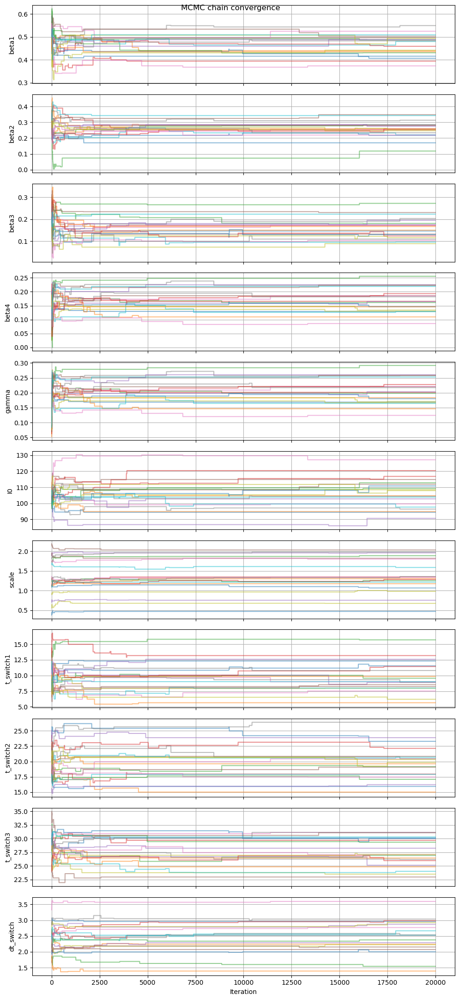

In [46]:
n_chains = 20
t_max = 100
true_params = [0.4, 0.2, 1/8, 1/16, 0.1, 100, 2, 7, 14, 21, 3]  # True values for beta_before, beta_after, gamma, I0, scale
I_true = sir_discrete_multi_sw(*true_params, t_max, N)  # Generate true epidemic curve
I_true += np.random.normal(0, true_params[6], size=t_max)  # Add noise

# ---- RUN MCMC ----
initial_guess = [0.5, 0.3, 0.2, 0.15, 0.09, 105, 1.5, 10, 20, 30, 2.5]  # beta1, beta2, beta3, beta4, gamma, I0, scale, t1, t2, t3, t4, dt

initial_params_list = [
    initial_guess + np.random.normal(0, [0.02, 0.02, 0.02, 0.02, 0.02, 2, 0.5, 2, 2, 2, 0.5], 11)
    for _ in range(n_chains)
]

step_sizes_list = [
    np.array([0.02, 0.02, 0.02, 0.02, 0.02, 2, 0.02, 0.5, 0.5, 0.5, 0.05]) + np.random.uniform(-0.005, 0.005, 11)
    for _ in range(n_chains)
]

samples = metropolis_hastings_multi_chain(log_posterior, initial_params_list, step_sizes_list, I_true, n_iter=20000, n_chains=n_chains)

# ---- PLOT RESULTS IN SUBPLOTS ----
param_names = ["beta1", "beta2", "beta3", "beta4", "gamma", "I0", "scale", "t_switch1", "t_switch2", "t_switch3", "dt_switch"]
fig, axes = plt.subplots(len(param_names), 1, figsize=(10, 2 * len(param_names)), sharex=True)

for i, ax in enumerate(axes):
    for chain in samples:
        ax.plot(chain[:, i], alpha=0.5)
    ax.set_ylabel(param_names[i])
    ax.grid()

axes[-1].set_xlabel("Iteration")
plt.suptitle("MCMC chain convergence")
plt.tight_layout()
plt.show()

    Parameter  True Value  Inferred Mean   Std Dev
0       beta1      0.4000       0.464653  0.044955
1       beta2      0.2000       0.255861  0.051718
2       beta3      0.1250       0.159785  0.047720
3       beta4      0.0625       0.169747  0.043473
4       gamma      0.1000       0.205756  0.042596
5          I0    100.0000     106.494420  9.164034
6       scale      2.0000       1.364609  0.439007
7   t_switch1      7.0000       9.745860  2.406999
8   t_switch2     14.0000      19.685643  2.762432
9   t_switch3     21.0000      27.564479  2.612935
10  dt_switch      3.0000       2.484024  0.511458


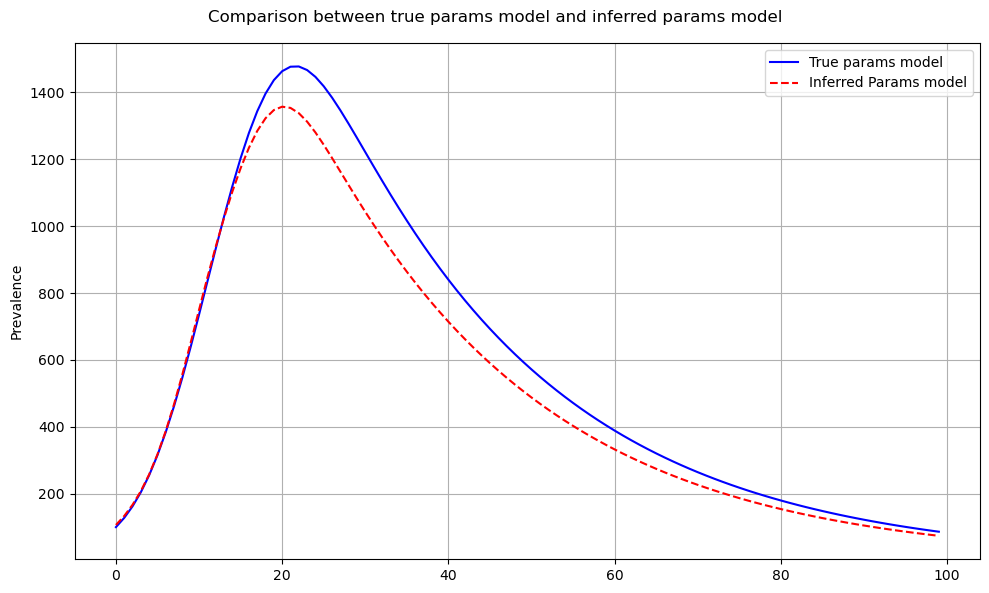

In [47]:
burn_in = 1000
mean_estimates = np.mean(samples[:, -burn_in:, :], axis=(0, 1))
std_estimates = np.std(samples[:, -burn_in:, :], axis=(0, 1))

beta1_sampled, beta2_sampled, beta3_sampled, beta4_sampled, gamma_sampled, I0_sampled, scale_sampled, t_switch1_sampled, t_switch2_sampled, t_switch3_sampled, dt_switch_sampled = mean_estimates

# Creazione DataFrame pandas
df_results = pd.DataFrame({
    'Parameter': param_names,
    'True Value': true_params,
    'Inferred Mean': mean_estimates,
    'Std Dev': std_estimates
})

# Mostra DataFrame
print(df_results)
    
# ---- GENERIAMO LE DUE SIMULAZIONI ----
I_true_model = sir_discrete_multi_sw(*true_params, t_max, N)
I_sampled_model = sir_discrete_multi_sw(*mean_estimates, t_max, N)

# ---- PLOT CONFRONTO ----
fig = plt.figure(figsize=(10, 6))

# Plot Infected Cases
plt.plot(I_true_model, label="True params model", color="blue")
plt.plot(I_sampled_model, label="Inferred Params model", color="red", linestyle="dashed")
plt.ylabel("Prevalence")
plt.legend()
plt.grid()

fig.suptitle("Comparison between true params model and inferred params model")
plt.tight_layout()
plt.show()

- **`Spreading rates`**: the estimates for the spreading rates are higher than the true values. This may signify that the model tends to compensate the pandemic evolution by using an higher spreading rate value, probably in order to adapt to particular patterns that may have been observed;
- **`Gamma`**: the estimate for gamma is also higher than the true one. This may be caused by the model trying to compensate higher spreading rates values;
- **`I0`**: good estimate on the initially infected people;
- **`Switching points`**: the estimated values are higher than the true one with a smaller transition time. This may signify that the model is trying to interpret the switching point as delayed, by using a faster transition.

Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta1, beta2, beta3, beta4, transient_begin_0, transient_begin_1, transient_begin_2, transient_len_0, transient_len_1, transient_len_2, gamma, I0, scale]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 478 seconds.


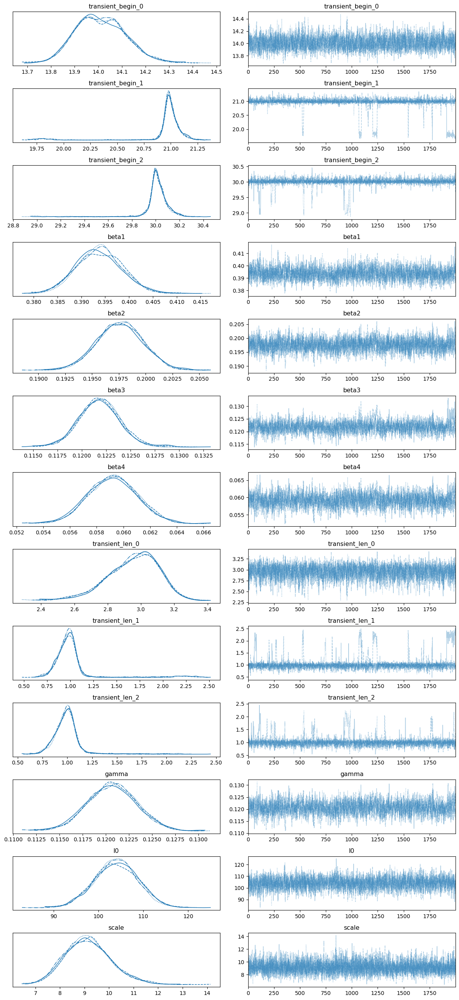

In [48]:
# SIR model with 3 switches and no delay 
from SIR_functions import smooth_step_function, pt_lognormal, make_delay_matrix, apply_delay, delay_cases_lognormal, _SIR_model


# ---- SIMULAZIONE DATI ----
true_params = {"beta1": 0.4, "beta2": 0.2, "beta3": 1/8, "beta4": 1/16, "gamma": 1/8, "I0": 100, "scale": 10, "delay": 8, "scale_delay": 0.5}
N = 1e6
t_max = 100
S = N - true_params["I0"]
t = np.linspace(0, 100, 100)
lambda_list = [0.4, 0.2, 1/8, 1/16]
num_days_sim = 100
tr_begin_list = [14, 21, 30]
tr_len_list = [3, 1, 1]
# SIR deterministico

# --------------------------------------------------------------------------------------------
    # build the time-dependent spreading rate
lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
lambda_before = lambda_list[0]
for tr_begin, tr_len, lambda_after in zip(
    tr_begin_list, tr_len_list, lambda_list[1:]
):
    lambda_t = smooth_step_function(
        start_val=0,
        end_val=1,
        t_begin=tr_begin,
        t_end=tr_begin + tr_len,
        t_total=num_days_sim,
    ) * (lambda_after - lambda_before)
    lambda_before = lambda_after
    lambda_t_list.append(lambda_t)

lambda_t = sum(lambda_t_list)
lambda_t = lambda_t.astype("float64")
# ----------------------------------------------------------------------------------------------

S = np.float64(S)
N = np.float64(N)  # Se è un intero, lo converto esplicitamente a float
I0 = np.float64(true_params["I0"])
mu = np.float64(true_params["gamma"])
_, _, I_new_true = _SIR_model(lambda_t, mu, S, I0, N)

f = pytensor.function([], [I_new_true])
I_new_true = f()[0]

# Rumore osservativo t-Student
I_obs = I_new_true + stats.t.rvs(df=4, loc=0, scale=true_params["scale"], size=len(I_new_true))

date_begin_simulation = datetime(2020, 3, 2)
#change_points_list = [14] # changing point at day 50 

# Lista contenente soltanto i change points 
change_points_list = [
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 2) + timedelta(days=14),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 0.2,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 3,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 2) + timedelta(days=21),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 1/8,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 1,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 2) + timedelta(days=30),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 1/16,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 1,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
]

# ---- MODELLO BAYESIANO PyMC ----
with pm.Model() as model:
    beta1 = pm.Lognormal("beta1", mu=np.log(0.4), sigma=0.5)
    beta2 = pm.Lognormal("beta2", mu = np.log(0.2), sigma = 0.5)
    beta3 = pm.Lognormal("beta3", mu = np.log(1/8), sigma = 0.5)
    beta4 = pm.Lognormal("beta4", mu = np.log(1/16), sigma = 0.5)

    lambda_list = [beta1, beta2, beta3, beta4]

    # list of start dates of the transient periods of the change points
    tr_begin_list = []
    dt_before = date_begin_simulation
    for i, cp in enumerate(change_points_list):
        dt_begin_transient = cp["pr_mean_date_begin_transient"]
        if dt_before is not None and dt_before > dt_begin_transient:
            raise RuntimeError("Dates of change points are not temporally ordered")
        prior_mean = (
            dt_begin_transient - date_begin_simulation).days - 1  # convert the provided date format (argument) into days (a number)
        tr_begin = pm.Normal(
            name=f"transient_begin_{i}",
            mu=prior_mean,
            sigma=cp["pr_sigma_date_begin_transient"],
        )
        tr_begin_list.append(tr_begin)
        dt_before = dt_begin_transient
    # same for transient times
    tr_len_list = []
    for i, cp in enumerate(change_points_list):
        tr_len = pm.Lognormal(
            name=f"transient_len_{i}",
            mu=np.log(cp["pr_median_transient_len"]),
            sigma=cp["pr_sigma_transient_len"],
        )
        tr_len_list.append(tr_len)
    # build the time-dependent spreading rate
    lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
    lambda_before = lambda_list[0]

    for tr_begin, tr_len, lambda_after in zip(
        tr_begin_list, tr_len_list, lambda_list[1:]
    ):
        lambda_t = smooth_step_function(
            start_val=0,
            end_val=1,
            t_begin=tr_begin,
            t_end=tr_begin + tr_len,
            t_total=num_days_sim,
        ) * (lambda_after - lambda_before)
        lambda_before = lambda_after
        lambda_t_list.append(lambda_t)
    lambda_t = sum(lambda_t_list)
    
    gamma = pm.Lognormal("gamma", mu=np.log(1/8), sigma=0.2)
    I0 = pm.HalfCauchy("I0", beta=100)
    #delay = pm.Lognormal("delay", mu=np.log(8), sigma=0.5)
    #scale_delay = pm.HalfNormal("scale_delay", sigma=1)
    scale = pm.HalfCauchy("scale", beta=10)

    S_begin = N - I0
    S, I, new_I = _SIR_model(
        lambda_t=lambda_t, mu=gamma, S_begin=S_begin, I_begin=I0, N=N
    )

    num_days_data = new_I.shape[-1]
    pm.StudentT("obs",
                 nu=4,
                 mu=new_I[:num_days_data],
                 sigma= scale, 
                 observed=I_obs)

    step = pm.NUTS(target_accept=0.95)
    trace = pm.sample(2000, tune=1000, cores=4, chains=4, step=step)


az.plot_trace(trace)
plt.tight_layout()
plt.show()

In [49]:
summary = az.summary(trace)
summary.head(15)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
transient_begin_0,14.010,0.106,13.810,14.197,0.002,0.001,2776.0,3092.0,1.00
transient_begin_1,20.975,0.187,20.878,21.175,0.018,0.013,858.0,239.0,1.01
transient_begin_2,30.010,0.122,29.885,30.181,0.007,0.005,1452.0,537.0,1.00
beta1,0.394,0.005,0.385,0.402,0.000,0.000,2086.0,3288.0,1.00
beta2,0.198,0.002,0.194,0.202,0.000,0.000,1767.0,2035.0,1.00
beta3,0.122,0.002,0.118,0.126,0.000,0.000,989.0,699.0,1.00
beta4,0.059,0.002,0.056,0.063,0.000,0.000,1434.0,2327.0,1.00
transient_len_0,2.952,0.154,2.664,3.231,0.003,0.002,2909.0,2869.0,1.00
transient_len_1,0.999,0.220,0.706,1.161,0.016,0.013,927.0,257.0,1.01
transient_len_2,0.998,0.159,0.747,1.180,0.008,0.006,1444.0,565.0,1.00


We can observe that the results here are similar to the one obtained with the MCMC algorithm from scratches, probably because the structure of the prior chosen is the same.

- **`Spreading rates (beta1–beta4)`**: the estimates for the spreading rates are slightly **lower than the true values** in the later phases (notably `beta4`), suggesting that the model may be interpreting a **decreasing transmission dynamic** over time. This could reflect containment measures or behavioral changes not explicitly modeled.

- **`Gamma`**: the estimate for the recovery rate is **very close to the true value**, with tight uncertainty bounds, indicating that the model captures the recovery dynamics accurately.

- **`I0`**: the estimate of the initial number of infected individuals is **very good**, with low uncertainty and consistent with the expected order of magnitude.

- **`Switching points (transient_begin_*)`**: the estimated switching points are slightly **delayed** compared to expectations, especially `transient_begin_1` and `transient_begin_2`. This could mean the model is attributing observed changes to **later time points**, possibly due to data lag or smoothing effects.

- **`Transition durations (transient_len_*)`**: the transitions between regimes are modeled with **short durations**, especially for `transient_len_1` and `transient_len_2`, which have high uncertainty. This suggests the model is interpreting changes as **sharp or abrupt**, potentially due to sudden interventions or underreported gradual changes.

- **`Scale`**: the scale parameter has a relatively high estimated value, indicating a notable **level of noise or overdispersion** in the observed data, possibly due to reporting inconsistencies or measurement variability.


# SIR model with 3 switches and delay 

| Parameter          | Variable   | Prior distribution              |
|-------------------|-----------|--------------------------------|
| Change points     | \( $t_1$ \)  | Normal(2020/03/09, 3)         |
|                   | \( $t_2$ \)  | Normal(2020/03/16, 1)         |
|                   | \( $t_3$ \)  | Normal(2020/03/23, 1)         |
| Change duration   | \( $\Delta t$ \) | LogNormal(log(3), 0.3)   |
| Spreading rates   | \( $\beta_0$ \) | LogNormal(log(0.4), 0.5)  |
|                   | \( $\beta_1$ \) | LogNormal(log(0.2), 0.5)  |
|                   | \( $\beta_2$ \) | LogNormal(log(1/8), 0.5)  |
|                   | \( $\beta_3$ \) | LogNormal(log(1/16), 0.5) |
| Recovery rate     | \( $\gamma $\)  | LogNormal(log(1/8), 0.2)     |
| Reporting delay   | \( D \)  | LogNormal(log(8), 0.2)       |
| Initially infected | \( $I_0$ \)  | HalfCauchy(100)               |
| Scale factor      | \( $\sigma$ \)  | HalfCauchy(10)                |


Running chain 1/20...


/Users/annagarbo/Desktop/Info_theory_covid/SIR_functions.py:284: RuntimeWarning: overflow encountered in exp
  accept_ratio = np.exp(logp_new - logp_old)


Running chain 2/20...
Running chain 3/20...
Running chain 4/20...
Running chain 5/20...
Running chain 6/20...
Running chain 7/20...
Running chain 8/20...
Running chain 9/20...
Running chain 10/20...
Running chain 11/20...
Running chain 12/20...
Running chain 13/20...
Running chain 14/20...
Running chain 15/20...
Running chain 16/20...
Running chain 17/20...
Running chain 18/20...
Running chain 19/20...
Running chain 20/20...


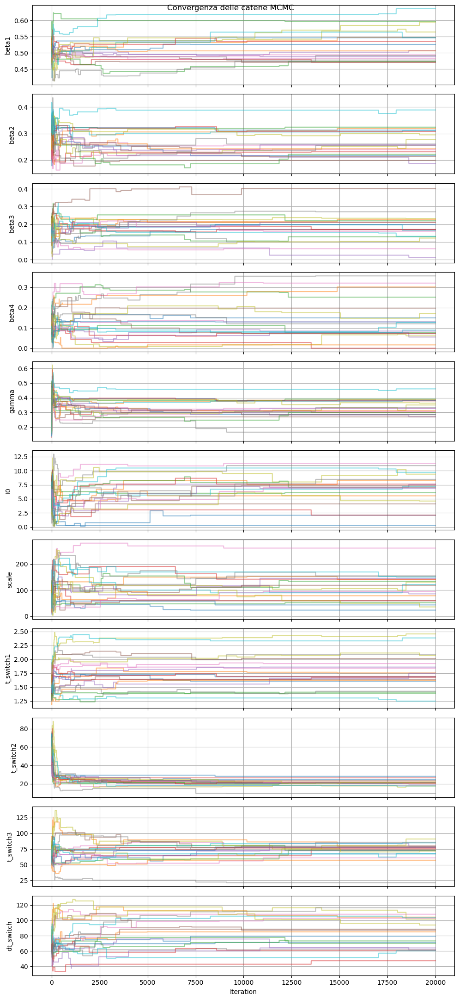

In [51]:
from SIR_functions import sir_discrete_delay_multi_sw

# ---- PARAMETERS ----
N = 1e6  # Population size
t_max = 100  # Total days of simulation
# Priors
N = 1e6
sigma_beta, mu_beta = 0.5, np.log(0.4)
sigma_beta_2, mu_beta_2 = 0.5, np.log(0.2)
sigma_beta_3, mu_beta_3 = 0.5, np.log(1/8)
sigma_beta_4, mu_beta_4 = 0.5, np.log(1/16)
sigma_gamma, mu_gamma = 0.2, np.log(1/8)
sigma_delay, mu_delay = 0.2, np.log(8)
sigma_I0 = 100
sigma_scale = 10
sigma_time1, mu_time1 = 3, 14
sigma_time2, mu_time2 = 1, 21
sigma_time3, mu_time3 = 1, 30
sigma_dt, mu_dt = 0.3, np.log(3)

# ---- PRIOR FUNCTION ----
def log_prior(beta1, beta2, beta3, beta4, gamma, delay, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch):
    logp = (    
        stats.lognorm.logpdf(beta1, s=sigma_beta, scale=np.exp(mu_beta)) +
        stats.lognorm.logpdf(beta2, s=sigma_beta_2, scale=np.exp(mu_beta_2)) +
        stats.lognorm.logpdf(beta3, s=sigma_beta_3, scale=np.exp(mu_beta_3)) +
        stats.lognorm.logpdf(beta4, s=sigma_beta_4, scale=np.exp(mu_beta_4)) +
        stats.lognorm.logpdf(gamma, s=sigma_gamma, scale=np.exp(mu_gamma)) +
        stats.lognorm.logpdf(delay, s=0.2, scale=np.exp(np.log(8))) +
        stats.halfcauchy.logpdf(I0, scale=sigma_I0) +
        stats.halfcauchy.logpdf(scale, scale=sigma_scale) +
        stats.norm.logpdf(t_switch1, loc = mu_time1, scale = sigma_time1) +
        stats.norm.logpdf(t_switch2, loc = mu_time2, scale = sigma_time2) +
        stats.norm.logpdf(t_switch3, loc = mu_time3, scale = sigma_time3) + 
        stats.lognorm.logpdf(dt_switch, s = sigma_dt, scale = np.exp(mu_dt))
    )
    return logp

# ---- LOG-LIKELIHOOD ----
def log_likelihood(params, data):
    beta1, beta2, beta3, beta4, gamma, delay, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch = params
    I_pred, C_pred = sir_discrete_delay_multi_sw(beta1, beta2, beta3, beta4, gamma, delay, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch, t_max, N)  # Solve SIR model with delay


    # Likelihood: Assume reported cases C_t follows Normal(C_pred, scale)
    return np.sum(stats.norm.logpdf(data, loc=C_pred, scale=scale))

# ---- LOG-POSTERIOR ----
def log_posterior(params, data):
    beta1, beta2, beta3, beta4, gamma, delay, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch = params
    prior = log_prior(beta1, beta2, beta3, beta4, gamma, delay, I0, scale, t_switch1, t_switch2, t_switch3, dt_switch) 
    if np.isinf(prior) or np.isnan(prior):
        return -np.inf  # Reject invalid samples
    return prior + log_likelihood(params, data)



n_chains = 20  # Numero di catene
true_params = np.array([0.4, 0.2, 1/8, 1/16, 1/8, 8, 100, 2, 14, 21, 30, 3])

params = np.array([0.5, 0.3, 0.17, 0.12, 0.15, 6, 80, 1.5, 60, 65, 70, 2.5])

I_true, C_true = sir_discrete_delay_multi_sw(*true_params, t_max, N)  # Generate true epidemic curve
C_true += np.random.normal(0, true_params[7], size=t_max)  # Add noise

# Nuovi intervalli di generazione basati sulle migliori stime
initial_params_list = [
    params + np.random.normal(0, [0.02, 0.02, 0.01, 0.01, 0.01, 2, 2, 0.2, 0.5, 0.5, 0.5, 0.05], 12)
    for _ in range(n_chains)
]

step_sizes_list = [
    np.array([0.01, 0.02, 0.02, 0.02, 0.05, 1, 20, 0.05, 5, 5, 5, 0.1]) + np.random.uniform(-0.005, 0.005, 12)
    for _ in range(n_chains)
]

samples_all_chains = metropolis_hastings_multi_chain(log_posterior, initial_params_list, step_sizes_list, C_true, n_iter=20000, n_chains=n_chains)

fig, axes = plt.subplots(len(param_names), 1, figsize=(10, 2 * len(param_names)), sharex=True)

for i, ax in enumerate(axes):
    for chain in samples_all_chains:
        ax.plot(chain[:, i], alpha=0.5)
    ax.set_ylabel(param_names[i])
    ax.grid()

axes[-1].set_xlabel("Iteration")
plt.suptitle("Convergenza delle catene MCMC")
plt.tight_layout()
plt.show()

    Parameter  True Value  Inferred Mean    Std Dev
0       beta1      0.4000       0.521509   0.046889
1       beta2      0.2000       0.265773   0.049489
2       beta3      0.1250       0.178706   0.079247
3       beta4      0.0625       0.139317   0.097259
4       gamma      0.1250       0.328785   0.061050
5       delay      8.0000       6.678793   2.834405
6          I0    100.0000     109.639050  54.759345
7       scale      2.0000       1.775773   0.308058
8   t_switch1     14.0000      21.012194   3.695631
9   t_switch2     21.0000      72.319137  14.039017
10  t_switch3     30.0000      82.089239  19.315962
11  dt_switch      3.0000       2.921832   0.480737


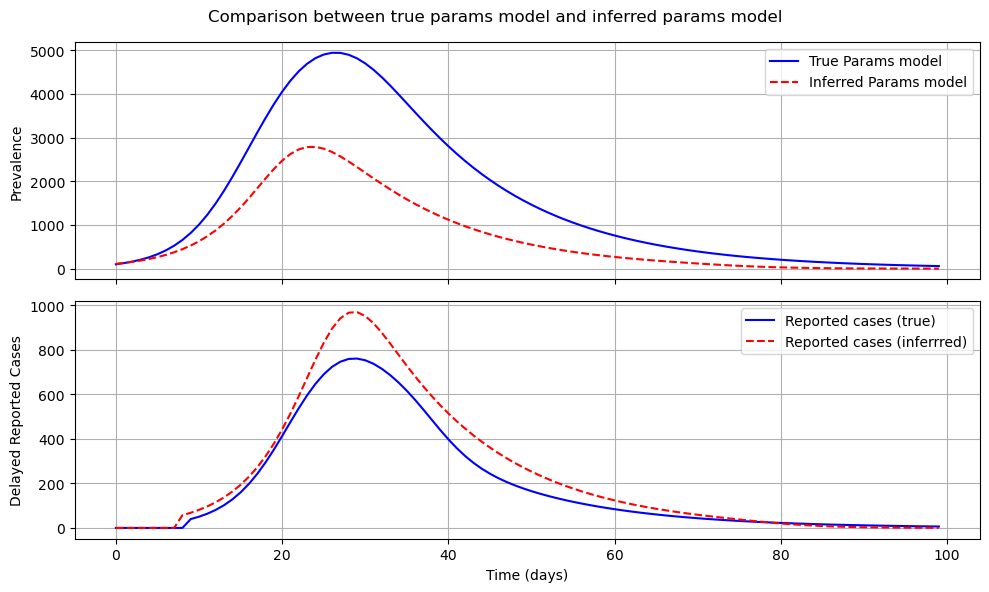

In [52]:
param_names = ["beta1", "beta2", "beta3", "beta4", "gamma", "delay", "I0", "scale", "t_switch1", "t_switch2", "t_switch3", "dt_switch"]

burn_in = 1000
mean_estimates = np.mean(samples_all_chains[:, -burn_in:, :], axis=(0, 1))
std_estimates = np.std(samples_all_chains[:, -burn_in:, :], axis=(0, 1))

beta1_sampled, beta2_sampled, beta3_sampled, beta4_sampled, gamma_sampled, delay_sampled, I0_sampled, scale_sampled, t_switch1_sampled, t_switch2_sampled, t_switch3_sampled, dt_switch_sampled = mean_estimates

# Creazione DataFrame pandas
df_results = pd.DataFrame({
    'Parameter': param_names,
    'True Value': true_params,
    'Inferred Mean': mean_estimates,
    'Std Dev': std_estimates
})

# Mostra DataFrame
print(df_results)
    
# ---- GENERIAMO LE DUE SIMULAZIONI ----
I_true_model, C_true_model = sir_discrete_delay_multi_sw(*true_params, t_max, N)
I_sampled_model, C_sampled_model = sir_discrete_delay_multi_sw(*mean_estimates, t_max, N)

fig, ax = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

# Plot Infected Cases
ax[0].plot(I_true_model, label="True Params model", color="blue")
ax[0].plot(I_sampled_model, label="Inferred Params model", color="red", linestyle="dashed")
ax[0].set_ylabel("Prevalence")
ax[0].legend()
ax[0].grid()

# Plot Reported Cases (con delay)
ax[1].plot(C_true_model, label="Reported cases (true)", color="blue")
ax[1].plot(C_sampled_model, label="Reported cases (inferrred)", color="red", linestyle="dashed")
ax[1].set_ylabel("Delayed Reported Cases")
ax[1].set_xlabel("Time (days)")
ax[1].legend()
ax[1].grid()

fig.suptitle("Comparison between true params model and inferred params model")
plt.tight_layout()
plt.show()


We can see that the delay is introducing some noise in the results, probably the model is not predicting correctly the evolution of the number of infected people over time. In particular it is influencing the values for the switching points and spreading rates.

Some comments on the parameters:
- **`dt_switch`**: the duration of the transitions is well estimated, suggesting that once a change is detected, the model captures its sharpness correctly. However, since the switching points are delayed, this **good estimation may still reflect a misaligned model response**.

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta1, beta2, beta3, beta4, transient_begin_0, transient_begin_1, transient_begin_2, transient_len_0, transient_len_1, transient_len_2, gamma, I0, delay, scale_delay, scale]


Output()

Sampling 4 chains for 500 tune and 2_000 draw iterations (2_000 + 8_000 draws total) took 991 seconds.


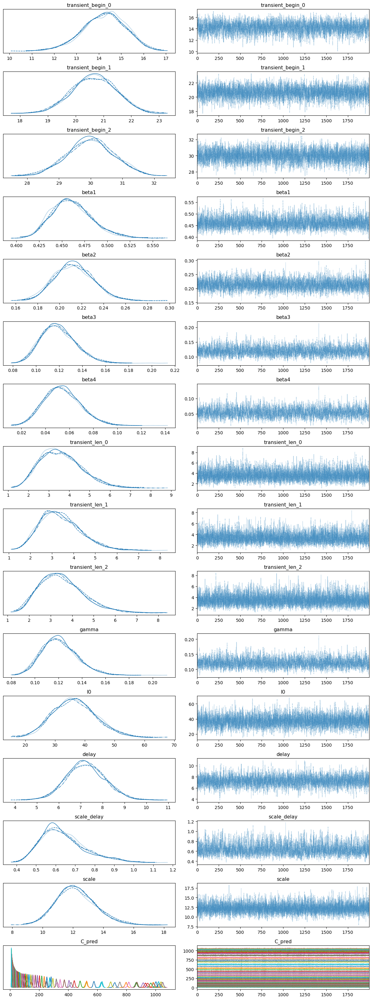

In [53]:
# SIR model with 3 switches and delay 
from SIR_functions import smooth_step_function, pt_lognormal, make_delay_matrix, apply_delay, delay_cases_lognormal, _SIR_model



# ---- SIMULAZIONE DATI ----
true_params = {"beta1": 0.4, "beta2": 0.2, "beta3": 1/8, "beta4": 1/16, "gamma": 1/8, "I0": 100, "scale": 10, "delay": 8, "scale_delay": 0.5}
N = 1e6
t_max = 100
S = N - true_params["I0"]
t = np.linspace(0, 100, 100)
lambda_list = [0.4, 0.2, 1/8, 1/16]
num_days_sim = 100
tr_begin_list = [14, 21, 30]
tr_len_list = [3, 1, 1]
# SIR deterministico

# --------------------------------------------------------------------------------------------
    # build the time-dependent spreading rate
lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
lambda_before = lambda_list[0]
for tr_begin, tr_len, lambda_after in zip(
    tr_begin_list, tr_len_list, lambda_list[1:]
):
    lambda_t = smooth_step_function(
        start_val=0,
        end_val=1,
        t_begin=tr_begin,
        t_end=tr_begin + tr_len,
        t_total=num_days_sim,
    ) * (lambda_after - lambda_before)
    lambda_before = lambda_after
    lambda_t_list.append(lambda_t)

lambda_t = sum(lambda_t_list)
lambda_t = lambda_t.astype("float64")
# ----------------------------------------------------------------------------------------------

S = np.float64(S)
N = np.float64(N)  # Se è un intero, lo converto esplicitamente a float
I0 = np.float64(true_params["I0"])
mu = np.float64(true_params["gamma"])
_, _, I_new_true = _SIR_model(lambda_t, mu, S, I0, N)

f = pytensor.function([], [I_new_true])
I_new_true = f()[0]

# Rumore osservativo t-Student
lognorm_kernel_sim = stats.lognorm.pdf(make_delay_matrix(t_max, t_max), s=true_params["scale_delay"], scale=true_params["delay"])
lognorm_kernel_sim /= lognorm_kernel_sim.sum(axis=1, keepdims=True)
C_obs = np.dot(I_new_true, lognorm_kernel_sim)

# Rumore osservativo t-Student
C_obs += stats.t.rvs(df=4, loc=0, scale=true_params["scale"], size=len(C_obs))

date_begin_simulation = datetime(2020, 3, 2)
#change_points_list = [50] # changing point at day 50 

# Lista contenente soltanto i change points 
change_points_list = [
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 2) + timedelta(days=14),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 0.2,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 3,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 2) + timedelta(days=21),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 1/8,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 1,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 2) + timedelta(days=30),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 1/16,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 1,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
]

# ---- MODELLO BAYESIANO PyMC ----
with pm.Model() as model:
    beta1 = pm.Lognormal("beta1", mu=np.log(0.4), sigma=0.5)
    beta2 = pm.Lognormal("beta2", mu = np.log(0.2), sigma = 0.5)
    beta3 = pm.Lognormal("beta3", mu = np.log(1/8), sigma = 0.5)
    beta4 = pm.Lognormal("beta4", mu = np.log(1/16), sigma = 0.5)

    lambda_list = [beta1, beta2, beta3, beta4]

    # list of start dates of the transient periods of the change points
    tr_begin_list = []
    dt_before = date_begin_simulation
    for i, cp in enumerate(change_points_list):
        dt_begin_transient = cp["pr_mean_date_begin_transient"]
        if dt_before is not None and dt_before > dt_begin_transient:
            raise RuntimeError("Dates of change points are not temporally ordered")
        prior_mean = (
            dt_begin_transient - date_begin_simulation).days - 1  # convert the provided date format (argument) into days (a number)
        tr_begin = pm.Normal(
            name=f"transient_begin_{i}",
            mu=prior_mean,
            sigma=cp["pr_sigma_date_begin_transient"],
        )
        tr_begin_list.append(tr_begin)
        dt_before = dt_begin_transient
    # same for transient times
    tr_len_list = []
    for i, cp in enumerate(change_points_list):
        tr_len = pm.Lognormal(
            name=f"transient_len_{i}",
            mu=np.log(cp["pr_median_transient_len"]),
            sigma=cp["pr_sigma_transient_len"],
        )
        tr_len_list.append(tr_len)
    # build the time-dependent spreading rate
    lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
    lambda_before = lambda_list[0]

    for tr_begin, tr_len, lambda_after in zip(
        tr_begin_list, tr_len_list, lambda_list[1:]
    ):
        lambda_t = smooth_step_function(
            start_val=0,
            end_val=1,
            t_begin=tr_begin,
            t_end=tr_begin + tr_len,
            t_total=num_days_sim,
        ) * (lambda_after - lambda_before)
        lambda_before = lambda_after
        lambda_t_list.append(lambda_t)
    lambda_t = sum(lambda_t_list)
    
    gamma = pm.Lognormal("gamma", mu=np.log(1/8), sigma=0.2)
    I0 = pm.HalfCauchy("I0", beta=100)
    delay = pm.Lognormal("delay", mu=np.log(8), sigma=0.5)
    scale_delay = pm.HalfNormal("scale_delay", sigma=1)
    scale = pm.HalfCauchy("scale", beta=10)

    S_begin = N - I0
    S, I, new_I = _SIR_model(
        lambda_t=lambda_t, mu=gamma, S_begin=S_begin, I_begin=I0, N=N
    )
    C_pred = pm.Deterministic("C_pred", delay_cases_lognormal(new_I, t_max, t_max, delay, scale_delay))

    num_days_data = C_pred.shape[-1]
    pm.StudentT("obs",
                 nu=4,
                 mu=C_pred[:num_days_data],
                 sigma= scale, 
                 observed=C_obs)

    trace = pm.sample(2000, tune=500, cores=4, chains=4, target_accept=0.85)



az.plot_trace(trace)
plt.tight_layout()
plt.show()


In [54]:
summary = az.summary(trace)
summary.head(15)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
transient_begin_0,14.235,0.965,12.334,15.936,0.020,0.014,2373.0,3389.0,1.0
transient_begin_1,20.666,0.795,19.154,22.105,0.013,0.009,3734.0,4545.0,1.0
transient_begin_2,29.998,0.731,28.661,31.407,0.013,0.010,2928.0,4779.0,1.0
beta1,0.461,0.023,0.422,0.505,0.000,0.000,2910.0,3498.0,1.0
beta2,0.213,0.018,0.181,0.247,0.000,0.000,2856.0,4204.0,1.0
beta3,0.119,0.015,0.092,0.147,0.000,0.000,2157.0,3468.0,1.0
beta4,0.054,0.015,0.027,0.083,0.000,0.000,1944.0,3626.0,1.0
transient_len_0,3.594,1.016,1.843,5.513,0.014,0.010,5262.0,5383.0,1.0
transient_len_1,3.390,0.953,1.736,5.180,0.014,0.010,5113.0,5284.0,1.0
transient_len_2,3.518,1.017,1.757,5.433,0.014,0.010,5882.0,4657.0,1.0


- **`Spreading rates (beta1–beta4)`**: the inferred spreading rates generally follow a decreasing trend, with `beta1` being overestimated compared to typical baseline values. `beta2` is slightly above expected, while `beta3` and `beta4` are lower. This indicates that the model is capturing different transmission regimes, although the high value of `beta1` may suggest an initial overcompensation for early spread.

- **`Gamma`**: the recovery rate `gamma` is close to expected values, though it shows a relatively wide credible interval. This suggests some uncertainty in the recovery dynamics, but the inference remains plausible.

- **`I0`**: the initial number of infected individuals is significantly **underestimated** compared to other models or expected scenarios (e.g., much lower than 100). This may point to a mismatch between the initial conditions and observed data, possibly due to a strong prior or insufficient early data.

- **`Delay` and `Scale_delay`**: the estimated observation delay is slightly **under the expected value** of 8, suggesting that the model interprets observations as occurring slightly earlier. `Scale_delay` reflects moderate noise in the delay model, with reasonable uncertainty.

- **`Scale`**: the inferred scale parameter is **quite high**, suggesting substantial variability or noise in the observed data. The model appears to be accounting for this uncertainty well.

- **`Switching points (transient_begin_0–2)`**: these are reasonably estimated and appear consistent with a multi-phase dynamic. The small standard deviations indicate reliable inference, suggesting the model effectively detects regime changes.

- **`Transition lengths (transient_len_0–2)`**: all transitions have similar estimated durations (around 3.5), suggesting **smooth and comparable phase changes**. The relatively large standard deviations imply a degree of uncertainty, but the model captures these transitions with consistent structure.


---
# WEEKLY MODULATION

In the past sections we have not taken into account of the weekly modulation effect: in particular we can predict that the spreading of the pandemic will decrease during the weekend as a conseguence of closure of shops and markets.

The weekend modulation is being implemented in two ways:
- ```step function```: during the weekday the modulation factor is zero, while during the weekend there is a reduction factor applied on the number of inferred cases;
- ```abs_sine```: in this case the modulation is smooth and periodic over 7 days. The offset_rad parameter is drawn from a Von Mises distribution. In this case the modulation doesn't have hard boundaries.

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [beta1, beta2, beta3, beta4, transient_begin_0, transient_begin_1, transient_begin_2, transient_len_0, transient_len_1, transient_len_2, gamma, I0, delay, scale_delay, scale, weekend_factor]


Output()

Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 327 seconds.
There were 1397 divergences after tuning. Increase `target_accept` or reparameterize.
We recommend running at least 4 chains for robust computation of convergence diagnostics
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


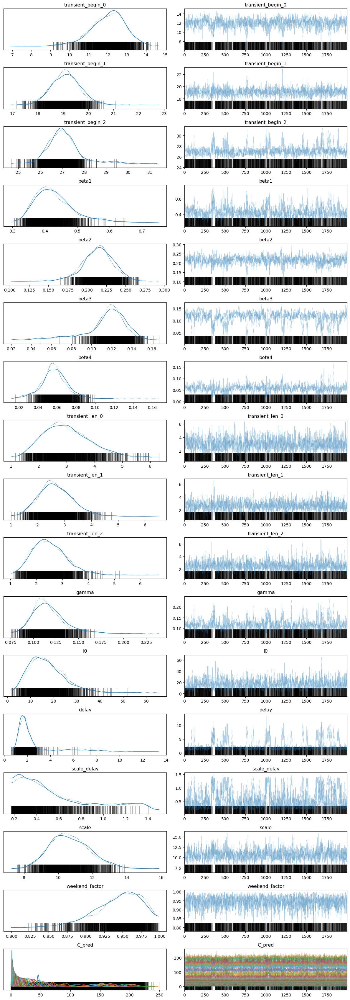

In [56]:
import pymc as pm
import pytensor
import pytensor.tensor as pt
import numpy as np
from datetime import datetime, timedelta 
import arviz as az
import matplotlib.pyplot as plt
from SIR_functions import _SIR_model, smooth_step_function, delay_cases_lognormal, make_delay_matrix

def SIR_with_change_points(
    new_cases_obs,
    change_points_list,
    date_begin_simulation,
    num_days_sim,
    diff_data_sim,
    N,
    weekends_modulated=True,
    weekend_modulation_type='step'):

    with pm.Model() as model:
        beta1 = pm.Lognormal("beta1", mu=np.log(0.4), sigma=0.5)
        beta2 = pm.Lognormal("beta2", mu = np.log(0.2), sigma = 0.5)
        beta3 = pm.Lognormal("beta3", mu = np.log(1/8), sigma = 0.5)
        beta4 = pm.Lognormal("beta4", mu = np.log(1/16), sigma = 0.5)

        lambda_list = [beta1, beta2, beta3, beta4]
 
        # list of start dates of the transient periods of the change points
        tr_begin_list = []
        dt_before = date_begin_simulation
        for i, cp in enumerate(change_points_list):
            dt_begin_transient = cp["pr_mean_date_begin_transient"]
            if dt_before is not None and dt_before > dt_begin_transient:
                raise RuntimeError("Dates of change points are not temporally ordered")
            prior_mean = (
                dt_begin_transient - date_begin_simulation).days - 1  # convert the provided date format (argument) into days (a number)
            tr_begin = pm.Normal(
                name=f"transient_begin_{i}",
                mu=prior_mean,
                sigma=cp["pr_sigma_date_begin_transient"],
            )
            tr_begin_list.append(tr_begin)
            dt_before = dt_begin_transient
        # same for transient times
        tr_len_list = []

        for i, cp in enumerate(change_points_list):
            tr_len = pm.Lognormal(
                name=f"transient_len_{i}",
                mu=np.log(cp["pr_median_transient_len"]),
                sigma=cp["pr_sigma_transient_len"],
            )
            tr_len_list.append(tr_len)
        # build the time-dependent spreading rate
        lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
        lambda_before = lambda_list[0]

        for tr_begin, tr_len, lambda_after in zip(
            tr_begin_list, tr_len_list, lambda_list[1:]
        ):
            lambda_t = smooth_step_function(
                start_val=0,
                end_val=1,
                t_begin=tr_begin,
                t_end=tr_begin + tr_len,
                t_total=num_days_sim,
            ) * (lambda_after - lambda_before)
            lambda_before = lambda_after
            lambda_t_list.append(lambda_t)
        lambda_t = sum(lambda_t_list)

        gamma = pm.Lognormal("gamma", mu=np.log(1/8), sigma=0.2)
        I0 = pm.HalfCauchy("I0", beta=100)
        delay = pm.Lognormal("delay", mu=np.log(8), sigma=0.5)
        scale_delay = pm.HalfNormal("scale_delay", sigma=1)
        scale = pm.HalfCauchy("scale", beta=10)

        S_begin = N - I0
        S, I, new_I = _SIR_model(lambda_t, gamma, S_begin, I0, N)

        # Delay per i dati osservati (approssimazione gaussiana)
        C_pred = pm.Deterministic("C_pred", delay_cases_lognormal(new_I, t_max, t_max, delay, scale_delay))

        # MODULAZIONE WEEKEND
        if weekends_modulated:
            week_end_factor = pm.Beta('weekend_factor', mu=0.7,
                                                        sigma=0.17)
            if weekend_modulation_type == 'step':
                modulation = np.zeros(num_days_sim)
                for i in range(num_days_sim):
                    if i <= diff_data_sim:
                        modulation[i] = 1
                    else:
                        date_curr = date_begin_simulation  + timedelta(days=i + diff_data_sim + 1)
                        if date_curr.isoweekday() in [6, 7]: # default weekend days are Saturday and Sunday (6 and 7)
                            modulation[i] = 1
            elif weekend_modulation_type == 'abs_sine':
                offset_rad = pm.VonMises('offset_modulation_rad', mu = 0, kappa = 0.01)
                offset = pm.Deterministic('offset_modulation', offset_rad/(2*np.pi)*7)
                t = np.array([0 if i <= diff_data_sim or (i + diff_data_sim + 1) % 7 == 0 else i - diff_data_sim for i in range(t_max)])
                modulation = 1-pt.abs(pt.sin(t/7 * np.pi + offset_rad/2))

            multiplication_vec = np.ones(num_days_sim) - (1 - week_end_factor) * modulation
            new_cases_inferred_eff  = C_pred * multiplication_vec
        else:
            new_cases_inferred_eff = C_pred

        # Likelihood
        pm.StudentT("_new_cases_studentT", nu=4,
                    mu=new_cases_inferred_eff[:len(new_cases_obs)],
                    sigma= scale,
                    observed=new_cases_obs)

        # Deterministiche per le posterior
        #pm.Deterministic("lambda_t", lambda_t)
        #pm.Deterministic("new_cases_inferred", new_cases_inferred_eff)

    return model

# ---- SIMULAZIONE DATI ----
true_params = {"beta1": 0.4, "beta2": 0.2, "beta3": 1/8, "beta4": 1/16, "gamma": 1/8, "I0": 100, "scale": 10, "delay": 8, "scale_delay": 0.5}
N = 83e6
t_max = 100
S = N - true_params["I0"]
t = np.linspace(0, 100, 100)
lambda_list = [0.4, 0.2, 1/8, 1/16]
num_days_sim = 100
tr_begin_list = [7, 14, 21]
tr_len_list = [3, 1, 1]

# Impostazioni modello
date_begin_simulation = datetime(2020, 3, 2)
num_days_sim = 100
diff_data_sim = 10 # giorno dopo il quale osservo il primo valore in caso di presenza di delay nel modello, 
                   # ossia se la simulazione ha un delay di 8 giorni vedrò il primo caso al giorno 8

# --------------------------------------------------------------------------------------------
    # build the time-dependent spreading rate
lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
lambda_before = lambda_list[0]
for tr_begin, tr_len, lambda_after in zip(
    tr_begin_list, tr_len_list, lambda_list[1:]
):
    lambda_t = smooth_step_function(
        start_val=0,
        end_val=1,
        t_begin=tr_begin,
        t_end=tr_begin + tr_len,
        t_total=num_days_sim,
    ) * (lambda_after - lambda_before)
    lambda_before = lambda_after
    lambda_t_list.append(lambda_t)

lambda_t = sum(lambda_t_list)
lambda_t = lambda_t.astype("float64")
# ----------------------------------------------------------------------------------------------

# Data simulation with true values 
S = np.float64(S)
N = np.float64(N)  # Se è un intero, lo converto esplicitamente a float
I0 = np.float64(true_params["I0"])
mu = np.float64(true_params["gamma"])
_, _, I_new_true = _SIR_model(lambda_t, mu, S, I0, N)

f = pytensor.function([], [I_new_true])
I_new_true = f()[0]

# Rumore osservativo t-Student
lognorm_kernel_sim = stats.lognorm.pdf(make_delay_matrix(t_max, t_max), s=true_params["scale_delay"], scale=true_params["delay"])
lognorm_kernel_sim /= lognorm_kernel_sim.sum(axis=1, keepdims=True)
C_obs = np.dot(I_new_true, lognorm_kernel_sim)

# Introduction of the weekend modulation inside the model 
f_w = 0.7  # Ampiezza della modulazione settimanale
Phi_w = 0   # Fase della modulazione settimanale

date_begin = date_begin_simulation + timedelta(days=diff_data_sim + 1)


t = np.array([0 if i <= diff_data_sim or (i + diff_data_sim + 1) % 7 == 0 else i - diff_data_sim for i in range(t_max)])


modulation = 1 - np.abs(np.sin(t / 7 * np.pi + Phi_w / 2))

multiplication_vec = np.ones(num_days_sim) - (1 - f_w) * modulation # è un fattore riduttivo per l'array C_obs, che va da 1 a sotto 1 

# Applicazione della modulazione ai dati osservati
C_obs *= multiplication_vec

# Rumore osservativo t-Student
C_obs += stats.t.rvs(df=4, loc=0, scale=true_params["scale"], size=len(C_obs))


# Definizione change points
change_points_list = [
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 2) + timedelta(days=14),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 0.2,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 3,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 2) + timedelta(days=21),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 1/8,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 1,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 2) + timedelta(days=30),  # Giorno 50 dalla data iniziale
        "pr_median_lambda": 1/16,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 1,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
]



# Esegui inferenza bayesiana
model = SIR_with_change_points(
    C_obs,
    change_points_list,
    date_begin_simulation,
    num_days_sim,
    diff_data_sim,
    N,
    weekends_modulated=True,
    weekend_modulation_type='step'
)

with model:
    trace = pm.sample(2000, tune=1000, target_accept=0.9, cores=2)

az.plot_trace(trace)
plt.tight_layout()
plt.show()


In [57]:
summary = az.summary(trace)
summary.head(15)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
transient_begin_0,11.995,0.947,10.347,13.879,0.045,0.032,466.0,741.0,1.00
transient_begin_1,19.105,0.583,17.989,20.145,0.019,0.014,921.0,1374.0,1.00
transient_begin_2,27.096,0.809,25.692,28.824,0.047,0.034,422.0,322.0,1.01
beta1,0.430,0.063,0.325,0.552,0.003,0.002,413.0,491.0,1.00
beta2,0.214,0.021,0.175,0.253,0.001,0.001,535.0,557.0,1.00
beta3,0.114,0.022,0.064,0.149,0.002,0.001,177.0,341.0,1.01
beta4,0.057,0.014,0.027,0.083,0.001,0.001,329.0,479.0,1.00
transient_len_0,3.008,0.842,1.542,4.582,0.022,0.016,1456.0,1847.0,1.00
transient_len_1,2.682,0.632,1.507,3.811,0.015,0.010,1784.0,1381.0,1.00
transient_len_2,2.501,0.666,1.346,3.696,0.019,0.013,1289.0,1776.0,1.00


# Temporal analysis on a real dataset 

In the past sections we have performed inference on the SIR model artificial dataset, in particular we have inferred the principal parameters governing the spreading of the pandemic. 

In this section we are introducing a real dataset, given by the *John Hopkins University* and updated until **3/10/2023** (available  [here](https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv)).

In the dataset, data taken from 201 countries are listed, showing also the latitude and longitude coordinates. As described in the paper, we are going to select only data referred to the spreading disease of the pandemic in Germany, starting from **22/01/2020** until **3/10/2023**.

In the first part we will implement the **MCMC** sampling technique, while in the second one we will use the **PYMC** method. We expect the latter to yield better results due to the increased model complexity.

In [6]:
import pandas as pd
import matplotlib.pyplot as plt 
import os
import numpy as np
from scipy.integrate import odeint
import scipy.stats as stats
import pymc as pm
import pytensor 
import pytensor.tensor as pt
import pandas as pd 
import arviz as az 
import multiprocessing
from datetime import datetime, timedelta 
from SIR_functions import metropolis_hastings, metropolis_hastings_multi_chain
import requests

In [ ]:
## Download the latest dataset informations  

url_conf = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
url_death = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv'
url_rec = 'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv'
filename_conf = 'confirmed_cases.csv'
filename_death = 'death_cases.csv'
filename_rec = 'rec_cases.csv'
response_conf, response_death, response_rec = requests.get(url_conf), requests.get(url_death), requests.get(url_rec)
with open(filename_conf, 'wb') as file:
   file.write(response_conf.content)
with open(filename_death, 'wb') as file:
   file.write(response_death.content)
with open(filename_rec, 'wb') as file:
   file.write(response_rec.content)
print('Csv files downloaded successfully.')

In [7]:
filename_conf = 'confirmed_cases.csv'
filename_death = 'death_cases.csv'
filename_rec = 'rec_cases.csv'

In [8]:
confirmed_cases = pd.read_csv(filename_conf)
deaths_confirmed = pd.read_csv(filename_death)
recovered_confirmed = pd.read_csv(filename_rec)

# Showing the dataset and dropping not informative columns 
confirmed_cases = confirmed_cases.drop(columns = ["Province/State", "Lat", "Long"], axis = 1)
deaths_confirmed = deaths_confirmed.drop(columns = ["Province/State", "Lat", "Long"], axis = 1)
recovered_confirmed = recovered_confirmed.drop(columns = ["Province/State", "Lat", "Long"], axis = 1)
confirmed_cases

,Country/Region,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,2/28/23,3/1/23,3/2/23,3/3/23,3/4/23,3/5/23,3/6/23,3/7/23,3/8/23,3/9/23
0,Afghanistan,0,0,0,0,0,0,0,0,0,...,209322,209340,209358,209362,209369,209390,209406,209436,209451,209451
1,Albania,0,0,0,0,0,0,0,0,0,...,334391,334408,334408,334427,334427,334427,334427,334427,334443,334457
2,Algeria,0,0,0,0,0,0,0,0,0,...,271441,271448,271463,271469,271469,271477,271477,271490,271494,271496
3,Andorra,0,0,0,0,0,0,0,0,0,...,47866,47875,47875,47875,47875,47875,47875,47875,47890,47890
4,Angola,0,0,0,0,0,0,0,0,0,...,105255,105277,105277,105277,105277,105277,105277,105277,105288,105288
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284,West Bank and Gaza,0,0,0,0,0,0,0,0,0,...,703228,703228,703228,703228,703228,703228,703228,703228,703228,703228
285,Winter Olympics 2022,0,0,0,0,0,0,0,0,0,...,535,535,535,535,535,535,535,535,535,535
286,Yemen,0,0,0,0,0,0,0,0,0,...,11945,11945,11945,11945,11945,11945,11945,11945,11945,11945
287,Zambia,0,0,0,0,0,0,0,0,0,...,343012,343012,343079,343079,343079,343135,343135,343135,343135,343135


In [9]:
n = len(confirmed_cases[confirmed_cases['Country/Region'] == 'Germany'])
g_I_new = confirmed_cases[confirmed_cases['Country/Region'] == 'Germany'].dropna(axis = 1)
g_R = recovered_confirmed[recovered_confirmed['Country/Region'] == 'Germany'].dropna(axis = 1)
g_D = deaths_confirmed[deaths_confirmed['Country/Region'] == 'Germany'].dropna(axis = 1)

# Checking for NaN values 
print(f'Number of values dropped: {len(g_I_new) - n}')

Number of values dropped: 0


In [13]:
# Data di partenza definita manualmente
start_date = '3/2/20'  # formato MM/GG/AA (verifica il formato del tuo DataFrame)

numeric_cols = g_I_new.columns[3:]

col_index_start = np.where(numeric_cols == start_date)[0][0]

g_I_new = g_I_new.iloc[:, col_index_start + 3:]  # +3 per compensare le prime colonne non numeriche
g_R = g_R.iloc[:, col_index_start + 3:]
g_D = g_D.iloc[:, col_index_start + 3:]

print("Primo giorno selezionato:", g_I_new.columns[0])
print(g_I_new.shape)

Primo giorno selezionato: 3/2/20
(1, 1103)


In [14]:
print(f'Date begin simulation: {g_I_new.iloc[:, 0].name}')
print(f'Date end simulation: {g_I_new.iloc[:, -1].name}')

min_col = g_I_new.iloc[0, 0:].idxmin()
max_col = g_I_new.iloc[0,-1:].idxmax()

print(f'Minimum number of infected: {g_I_new[min_col].values[0]}')
print(f'Maximum number of infected: {g_I_new[max_col].values[0]}')

Date begin simulation: 3/2/20
Date end simulation: 3/9/23
Minimum number of infected: 150
Maximum number of infected: 38249060


In [15]:
col_index_start = 1
col_index_stop = len(g_I_new.columns)

In [16]:
I_new = np.array(g_I_new.iloc[0, col_index_start:col_index_stop], dtype = np.float64)
R = np.array(g_R.iloc[0, col_index_start:col_index_stop]) 
D = np.array(g_D.iloc[0, col_index_start:col_index_stop], dtype = np.float64) 

Number of total days indexed: 1102


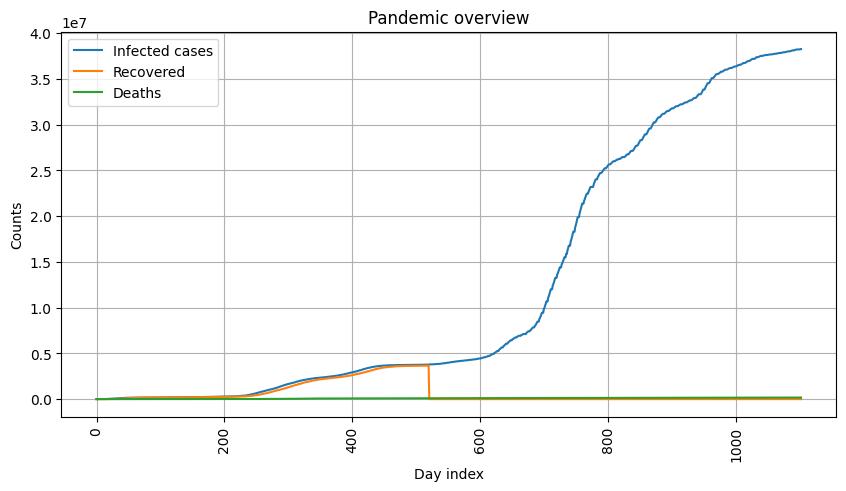

In [21]:
index = [i for i in range(len(I_new + 1))] 
print(f'Number of total days indexed: {len(index)}')
labels = g_I_new.columns[col_index_start:col_index_stop]

plt.figure(figsize = (10, 5))
plt.plot(index, I_new, label = 'Infected cases')
plt.plot(index, R, label = 'Recovered')
plt.plot(index, D, label = 'Deaths')
plt.xlabel('Day index')
plt.ylabel('Counts')
plt.xticks(rotation=90)

plt.legend()
plt.grid()
plt.title('Pandemic overview')
plt.show()

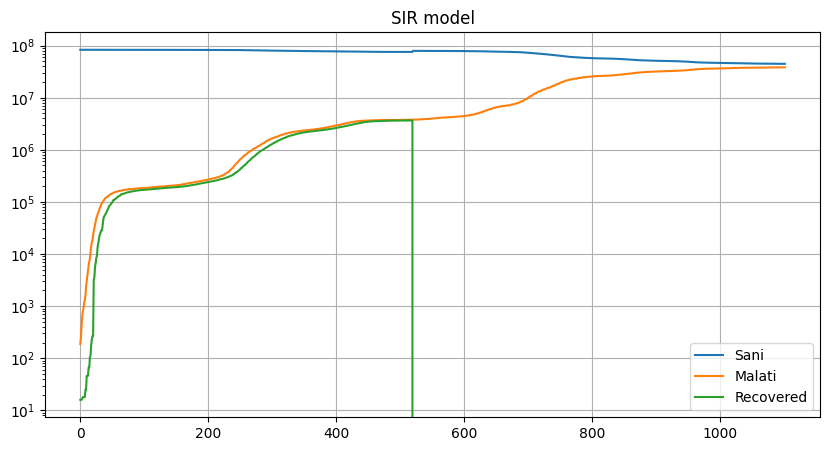

In [18]:
# SIR model plot 
N = 83e6
S = np.zeros(I_new.shape)
S = N - I_new - D-R # sottraggo infetti e morti al numero totale dei sani 

fig, ax = plt.subplots(figsize = (10, 5))
ax.plot(index, S, label = 'Sani')
ax.plot(index, I_new, label = 'Malati')
ax.plot(index, R, label = 'Recovered')
ax.set_yscale('log')
plt.legend()
plt.grid() 
plt.title('SIR model')
plt.show()

## Inferring real data with PYMC

We are now going to apply the PYMC algorithm to our dataset. The case structure adopted is accounting the 3 switches, delay and weekly modulation model.

In the following table we list the priors adopted:

| Parameter          | Variable   | Prior distribution              |
|-------------------|-----------|--------------------------------|
| Change points     | \( $t_1$ \)  | Normal(2020/03/09, 3)         |
|                   | \( $t_2$ \)  | Normal(2020/03/16, 1)         |
|                   | \( $t_3$ \)  | Normal(2020/03/23, 1)         |
| Change duration   | \( $\Delta t$ \) | LogNormal(log(3), 0.3)   |
| Spreading rates   | \( $\beta_0$ \) | LogNormal(log(0.4), 0.5)  |
|                   | \( $\beta_1$ \) | LogNormal(log(0.2), 0.5)  |
|                   | \( $\beta_2$ \) | LogNormal(log(1/8), 0.5)  |
|                   | \( $\beta_3$ \) | LogNormal(log(1/16), 0.5) |
| Recovery rate     | \( $\gamma $\)  | LogNormal(log(1/8), 0.2)     |
| Reporting delay   | \( D \)  | LogNormal(log(8), 0.2)       |
| Initially infected | \( $I_0$ \)  | HalfCauchy(100)               |
| Scale factor      | \( $\sigma$ \)  | HalfCauchy(10)                |
| Weekly mod amplitude | \($f_w$ \) | Beta(0.7, 0.17) |
| Weekly mod phase | \( $\Phi_w$ \) | VonMises(0, 0.01) |

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [beta1, beta2, beta3, beta4, transient_begin_0, transient_begin_1, transient_begin_2, transient_len_0, transient_len_1, transient_len_2, gamma, I0, delay, scale_delay, scale, weekend_factor]


Output()

Sampling 2 chains for 1_000 tune and 2_000 draw iterations (2_000 + 4_000 draws total) took 12665 seconds.
There were 951 divergences after tuning. Increase `target_accept` or reparameterize.
We recommend running at least 4 chains for robust computation of convergence diagnostics


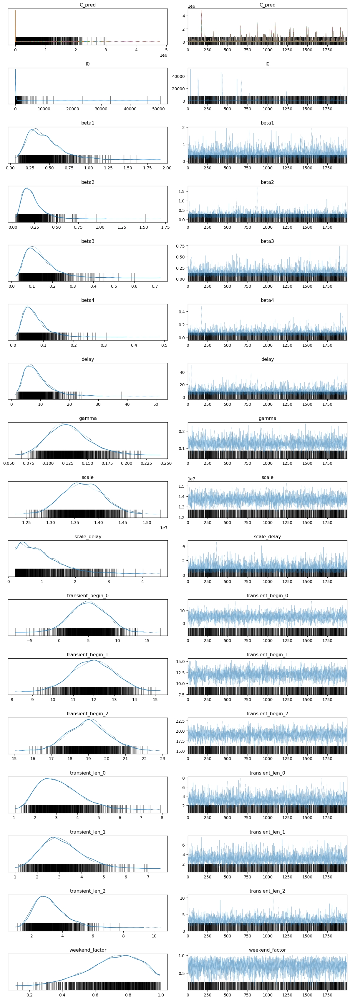

In [23]:
from scipy.integrate import odeint
import scipy.stats as stats
import pymc as pm
import pytensor
import pytensor.tensor as pt
import numpy as np
from datetime import datetime, timedelta 
import arviz as az
import matplotlib.pyplot as plt
from SIR_functions import _SIR_model, smooth_step_function, delay_cases_lognormal, make_delay_matrix

def SIR_with_change_points(
    new_cases_obs,
    change_points_list,
    date_begin_simulation,
    num_days_sim,
    diff_data_sim,
    N,
    weekends_modulated=True,
    weekend_modulation_type='step'):

    with pm.Model() as model:
        beta1 = pm.Lognormal("beta1", mu=np.log(0.4), sigma=0.5)
        beta2 = pm.Lognormal("beta2", mu = np.log(0.2), sigma = 0.5)
        beta3 = pm.Lognormal("beta3", mu = np.log(1/8), sigma = 0.5)
        beta4 = pm.Lognormal("beta4", mu = np.log(1/16), sigma = 0.5)

        lambda_list = [beta1, beta2, beta3, beta4]
 
        # list of start dates of the transient periods of the change points
        tr_begin_list = []
        dt_before = date_begin_simulation
        for i, cp in enumerate(change_points_list):
            dt_begin_transient = cp["pr_mean_date_begin_transient"]
            if dt_before is not None and dt_before > dt_begin_transient:
                raise RuntimeError("Dates of change points are not temporally ordered")
            prior_mean = (
                dt_begin_transient - date_begin_simulation).days - 1  # convert the provided date format (argument) into days (a number)
            tr_begin = pm.Normal(
                name=f"transient_begin_{i}",
                mu=prior_mean,
                sigma=cp["pr_sigma_date_begin_transient"],
            )
            tr_begin_list.append(tr_begin)
            dt_before = dt_begin_transient
        # same for transient times
        tr_len_list = []

        for i, cp in enumerate(change_points_list):
            tr_len = pm.Lognormal(
                name=f"transient_len_{i}",
                mu=np.log(cp["pr_median_transient_len"]),
                sigma=cp["pr_sigma_transient_len"],
            )
            tr_len_list.append(tr_len)
        # build the time-dependent spreading rate
        lambda_t_list = [lambda_list[0] * pt.ones(num_days_sim)]
        lambda_before = lambda_list[0]

        for tr_begin, tr_len, lambda_after in zip(
            tr_begin_list, tr_len_list, lambda_list[1:]
        ):
            lambda_t = smooth_step_function(
                start_val=0,
                end_val=1,
                t_begin=tr_begin,
                t_end=tr_begin + tr_len,
                t_total=num_days_sim,
            ) * (lambda_after - lambda_before)
            lambda_before = lambda_after
            lambda_t_list.append(lambda_t)
        lambda_t = sum(lambda_t_list)

        gamma = pm.Lognormal("gamma", mu=np.log(1/8), sigma=0.2)
        I0 = pm.HalfCauchy("I0", beta=100)
        delay = pm.Lognormal("delay", mu=np.log(8), sigma=0.5)
        scale_delay = pm.HalfNormal("scale_delay", sigma=1)
        scale = pm.HalfCauchy("scale", beta=10)

        S_begin = N - I0
        S, I, new_I = _SIR_model(lambda_t, gamma, S_begin, I0, N)

        # Delay per i dati osservati (approssimazione gaussiana)
        C_pred = pm.Deterministic("C_pred", delay_cases_lognormal(new_I, t_max, t_max, delay, scale_delay))

        # MODULAZIONE WEEKEND
        if weekends_modulated:
            week_end_factor = pm.Beta('weekend_factor', mu=0.7,
                                                        sigma=0.17)
            if weekend_modulation_type == 'step':
                modulation = np.zeros(num_days_sim)
                for i in range(num_days_sim):
                    if i <= diff_data_sim:
                        modulation[i] = 1
                    else:
                        date_curr = date_begin_simulation  + timedelta(days=i + diff_data_sim + 1)
                        if date_curr.isoweekday() in [6, 7]: # default weekend days are Saturday and Sunday (6 and 7)
                            modulation[i] = 1
            elif weekend_modulation_type == 'abs_sine':
                offset_rad = pm.VonMises('offset_modulation_rad', mu = 0, kappa = 0.01)
                offset = pm.Deterministic('offset_modulation', offset_rad/(2*np.pi)*7)
                t = np.array([0 if i <= diff_data_sim or (i + diff_data_sim + 1) % 7 == 0 else i - diff_data_sim for i in range(t_max)])
                modulation = 1-pt.abs(pt.sin(t/7 * np.pi + offset_rad/2))

            multiplication_vec = np.ones(num_days_sim) - (1 - week_end_factor) * modulation
            new_cases_inferred_eff  = C_pred * multiplication_vec
        else:
            new_cases_inferred_eff = C_pred

        # Likelihood
        pm.StudentT("_new_cases_studentT", nu=4,
                    mu=new_cases_inferred_eff[:len(new_cases_obs)],
                    sigma= scale,
                    observed=new_cases_obs)

    return model

N = 83e6
t = index
t_max = len(labels)
date_begin_simulation = datetime.strptime(labels[0], "%m/%d/%y") # la prima colonna della tabella è all' 1/22/20
num_days_sim = len(labels)
diff_data_sim = 10 # giorno dopo il quale osservo il primo valore in caso di presenza di delay nel modello, 
                   # ossia se la simulazione ha un delay di 8 giorni vedrò il primo caso al giorno 8

# Definizione change points
change_points_list = [
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 9),  # primo change point al 9 marzo 
        "pr_median_lambda": 0.2,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 3,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 16),  # secondo change point al 16 marzo 
        "pr_median_lambda": 1/8,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 1,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
    {
        "pr_mean_date_begin_transient": datetime(2020, 3, 23),  # terzo change point al 23 marzo 
        "pr_median_lambda": 1/16,  # λ₀ valore di default dalla tabella
        "pr_sigma_lambda": 0.5,  # σ per log-normal di λ₀
        "pr_sigma_date_begin_transient": 1,  # Default
        "pr_median_transient_len": 3,  # Default
        "pr_sigma_transient_len": 0.3,  # Default
    },
]



# Esegui inferenza bayesiana
model = SIR_with_change_points(
    I_new,
    change_points_list,
    date_begin_simulation,
    num_days_sim,
    diff_data_sim,
    N,
    weekends_modulated=True,
    weekend_modulation_type='step'
)

with model:
    trace = pm.sample(2000, tune=1000, target_accept=0.9, cores=2)

az.plot_trace(trace)
plt.tight_layout()
plt.show()

In [25]:
summary = az.summary(trace)

summary.tail(16)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
I0,4.126360e+02,2060.472,1.050000e-01,1.138219e+03,46.829,33.118,3145.0,1709.0,1.0
beta1,4.500000e-01,0.232,1.170000e-01,8.800000e-01,0.004,0.003,4359.0,1953.0,1.0
beta2,2.260000e-01,0.124,5.400000e-02,4.400000e-01,0.003,0.002,2842.0,2172.0,1.0
beta3,1.410000e-01,0.076,3.700000e-02,2.800000e-01,0.001,0.001,3320.0,2454.0,1.0
beta4,7.200000e-02,0.040,1.800000e-02,1.460000e-01,0.001,0.001,2324.0,1424.0,1.0
delay,8.838000e+00,4.510,2.342000e+00,1.688900e+01,0.079,0.060,3412.0,1944.0,1.0
gamma,1.270000e-01,0.026,8.300000e-02,1.790000e-01,0.000,0.000,3399.0,2275.0,1.0
scale,1.367796e+07,421080.832,1.289508e+07,1.444073e+07,7447.178,5266.431,3190.0,2266.0,1.0
scale_delay,9.550000e-01,0.565,2.090000e-01,1.962000e+00,0.012,0.008,1637.0,1105.0,1.0
transient_begin_0,5.007000e+00,3.010,-3.090000e-01,1.093000e+01,0.052,0.041,3266.0,2408.0,1.0


As is is possible to observe, the order of magnitude of the inferred parameters is the same as the considered "true" ones. Exceptions are given by the **I0** and **scale** parameters, characterized by out-of-range values. This can be explained considering the range of values in the real dataset: the number of infected is taking values starting from 0 (at the beginning of the pandemic) and going to **4e7** at the peak point. The prior choosen is characterized by huge tails, causing a great spreading of the predicted values around the mean. The result will be a highly variable and amplified prediction, as the model is more likely to overemphasize extreme data points.
The same reasoning can be applied to the scale parameter.